In [7]:
import sys
import os
import glob
import pandas as pd
import gensim.downloader as api
import numpy as np
import importlib
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cross_decomposition import CCA
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from tqdm import tqdm
import pandas as pd
import h5py
from sentence_transformers import SentenceTransformer
import caption_to_embedding
from load_hdf5 import load_depth_maps_from_hdf5
from caption_to_embedding import transform_captions
from sklearn.metrics import pairwise_distances
from sklearn import manifold
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tqdm import tqdm


input_map = "/tank/tgn252/metadata_annotations/result"
video_names = os.listdir(input_map)
print(len(video_names))


1163


In [2]:
import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401
from matplotlib import ticker

from sklearn import datasets, manifold

In [3]:
def get_dirs_with_subdir(dirs, subdir_name):
    """
    Returns a dictionary where the keys are directory names and the values are True if the directory contains a subdirectory with the given name, and False otherwise.

    Args:
        dirs (list): List of directory paths.
        subdir_name (str): Name of the subdirectory to check for.

    Returns:
        dict: Dictionary where the keys are directory names and the values are True if the directory contains a subdirectory with the given name, and False otherwise.
    """
    dirs_with_subdir = {}
    for d in dirs:
        subdirs = os.listdir(d)
        dirs_with_subdir[d] = subdir_name in subdirs
    true_dirs = [keys for keys, values in dirs_with_subdir.items() if values]

    return true_dirs

In [4]:
def plot_3d(points, points_color, title):
    x, y, z = points.T

    fig, ax = plt.subplots(
        figsize=(6, 6),
        facecolor="white",
        tight_layout=True,
        subplot_kw={"projection": "3d"},
    )
    fig.suptitle(title, size=16)
    col = ax.scatter(x, y, z, c=points_color, s=50, alpha=0.8)
    ax.view_init(azim=-60, elev=9)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.zaxis.set_major_locator(ticker.MultipleLocator(1))

    fig.colorbar(col, ax=ax, orientation="horizontal", shrink=0.6, aspect=60, pad=0.01)
    plt.show()


def plot_2d(points, points_color, title):
    fig, ax = plt.subplots(figsize=(3, 3), facecolor="white", constrained_layout=True)
    fig.suptitle(title, size=16)
    add_2d_scatter(ax, points, points_color)
    plt.show()


def add_2d_scatter(ax, points, points_color, title=None):
    x, y = points.T
    ax.scatter(x, y, c=points_color, s=50, alpha=0.8)
    ax.set_title(title)
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.yaxis.set_major_formatter(ticker.NullFormatter())




In [5]:
def find_files(video_name, dir_name, file_type, base_path="/tank/tgn252/metadata_annotations/result"):
    """
    Find all files of a given type in a specified directory (and its subdirectories) for a given video.

    Args:
        video_name (str): The name of the video.
        dir_name (str): The name of the directory to search.
        file_type (str): The type of the files to find (e.g., "csv" or "hdf5").
        base_path (str): The base path where the video directories are located.

    Returns:
        files (list): A list of paths to the files.
    """
    search_path = os.path.join(base_path, video_name, dir_name)
    files = glob.glob(os.path.join(search_path, f"**/*.{file_type}"), recursive=True)
    return files

# CAPTIONING

In [56]:
full_paths = [os.path.join(input_map, video_name) for video_name in video_names]
maps = get_dirs_with_subdir(full_paths, 'instance_segmentation')

print(f'n of maps with searched subdirectories : {len(maps)}' )

n of maps with searched subdirectories : 275


In [57]:

caption_maps = get_dirs_with_subdir(maps, 'captioning')

print(f'n of maps with searched subdirectories : {len(maps)}' )

n of maps with searched subdirectories : 275


In [28]:

data_caption = {}

for video_name in tqdm(maps):
    # Find CSV file in "captioning" subdirectory
    caption_csv = find_files(video_name, 'captioning', 'csv')
    if caption_csv:
        captions_df = pd.read_csv(caption_csv[0]) 
        # Extract the first caption
        caption = captions_df["Caption"].iloc[0]
        data_caption[video_name] = caption

    else:
        print(f"No CSV file found in captioning directory for video {video_name}")

print(len(data_caption.keys()))

 86%|████████▌ | 236/275 [00:00<00:00, 1177.84it/s]

['a woman is using a needle to thread a needle and thread.']
['a woman is demonstrating how to knit a yellow yarn.']
['two dogs are pulling a sled through the snow.']
['a man wearing a suit and tie']
['a dead crab is shown on a wet surface with a leaf.']
['two men are fighting in a boxing ring.']
['a man is using a small tool to make a stone.']
['a bear is sitting in the grass and then the camera is held up by its hands.']
['a goat is laying on the hay and it is eating hay.']
['a woman is sitting on a couch']
['a large body of water']
['a man is standing in front of a white board']
['a group of children dressed up as characters.']
['a man is squatting down with a barbell']
['a person is riding a motorcycle on the road']
['a young girl wearing headphones and a black tank top is playing with a bow.']
['a group of rabbits are shown in a group together.']
['a man is holding a large fish in his hand']
['a person is riding a jet ski in the ocean.']
['two fighter jets are shown on a runway an

100%|██████████| 275/275 [00:00<00:00, 1169.53it/s]

['a man is pushing a large piece of machinery through a field.']
['a person is riding a large mound of dirt and is shown in the background.']
['a child pushing a toy car']
['a woman is sitting in a car and talking to a man.']
['a tree is lit up by the fire']
['a young girl is dancing on a stage with a large screen behind her']
['a person is driving a tractor across a dirt road.']
['a large water spewing out of a large snow blower.']
['a group of people are swimming in a pool and one person is doing the backstroke.']
['a man is pushing a piece of furniture']
['a large tree is shown in the woods and a man is using a shovel to dig through the ground.']
['a man is rock climbing on a large rock face.']
['a person is showing how to open a wooden door.']
['a tree is lit up by the fire']
['a person is driving a tractor through a field of grass.']
['a woman wearing a pink jacket']
['a woman is demonstrating how to knit a green yarn.']
['a large tree is in the background']
['a man is walking on 

In [29]:


# Load a pre-trained sentence transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Assuming 'data' is a dictionary with video names as keys and their metadata as values
for video_name, values in data_caption.items():
    
    # Generate the embedding for the entire sentence
    embedding = model.encode(values)

    # Store the embedding back in the data dictionary
    data_caption[video_name]= embedding

In [31]:
for video_name, embedding_dict in data_caption.items():
    for scale_type, embedding in embedding_dict.items():
        print(f"Video: {video_name}, scale type: {scale_type}, embedding shape: {embedding}")

Video: /tank/tgn252/metadata_annotations/result/R_S_yt--jzScB82vKI_212.mp4, scale type: original, embedding shape: [-1.67254228e-02  1.77199300e-02 -2.65420433e-02 -5.16787544e-02
 -7.26298988e-02  3.49608101e-02  1.14063308e-01 -2.81616929e-03
 -4.28009853e-02  1.53541211e-02 -1.53628858e-02 -3.63158956e-02
 -7.37978742e-02 -7.87404925e-03 -6.99226707e-02  1.03467545e-02
 -3.61318365e-02  2.26596706e-02  2.69072019e-02  5.08375205e-02
  2.92577092e-02 -4.65862267e-02  4.21609469e-02  3.35443206e-02
  2.29875203e-02  1.28850313e-02 -4.36366275e-02  1.54476042e-03
  3.30239385e-02  4.73556854e-02 -8.39390084e-02 -3.60305421e-03
 -1.11099675e-01  3.31776356e-03 -7.84314610e-03  1.63680855e-02
 -4.08185758e-02  4.80649918e-02 -1.91394668e-02  4.71524559e-02
  3.63766551e-02 -9.71825942e-02 -2.01049913e-02 -3.11718769e-02
  1.98202636e-02  3.13304514e-02 -3.54010914e-03  4.51912358e-02
 -4.14628126e-02 -1.28907226e-02 -1.01327017e-01 -5.83902486e-02
 -6.35341331e-02 -1.11138858e-02  2.9815

In [30]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Initialize scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()

# Extract all embeddings
all_embeddings = np.array([data_caption[video_name] for video_name in data_caption.keys()])

# Standardize and normalize all embeddings
standardized_all_embeddings = standard_scaler.fit_transform(all_embeddings)
normalized_all_embeddings = minmax_scaler.fit_transform(all_embeddings)

# Store the standardized and normalized embeddings back into the dictionary
for i, video_name in enumerate(data_caption.keys()):
    data_caption[video_name] = {
        'original': all_embeddings[i],
        'standardized': standardized_all_embeddings[i],
        'normalized': normalized_all_embeddings[i]
    }

0


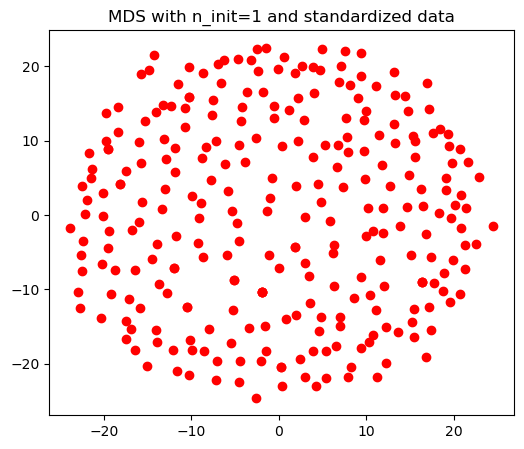

1


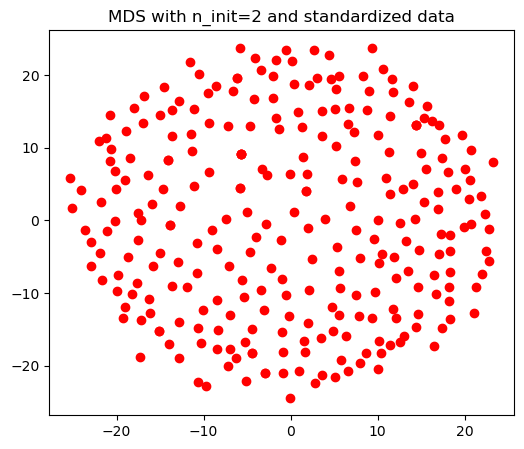

2
3


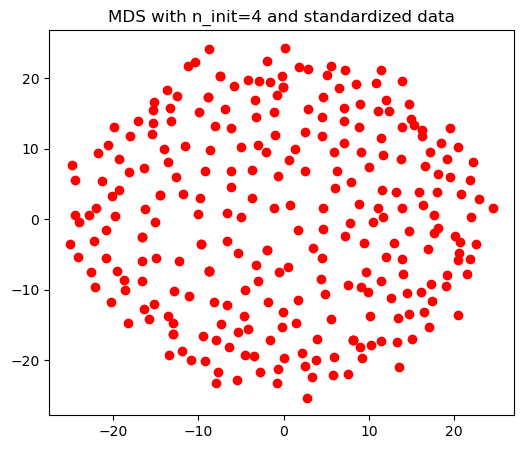

4
5
6
7


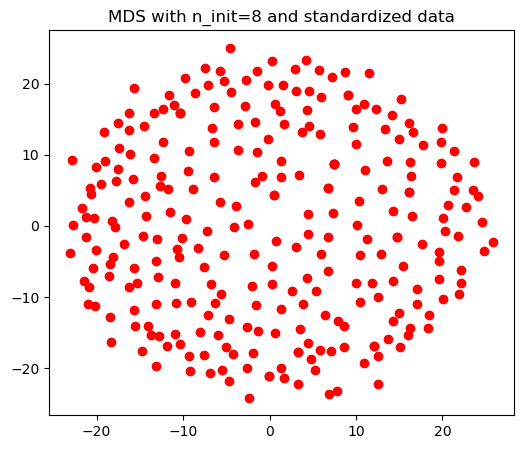

8
9
10
11


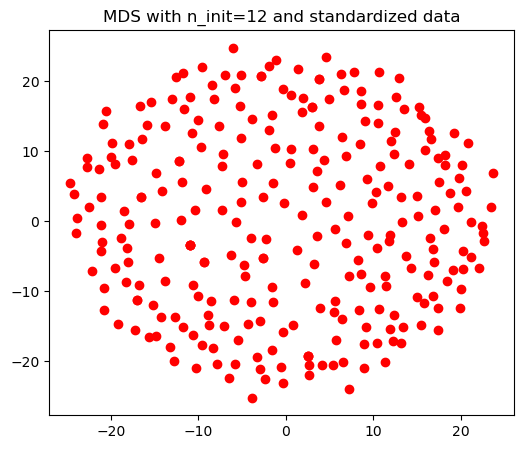

0


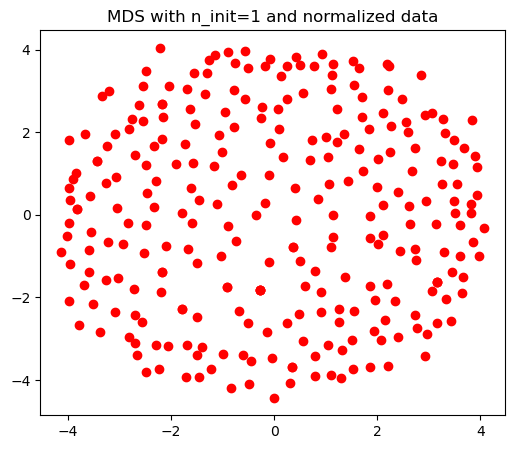

1


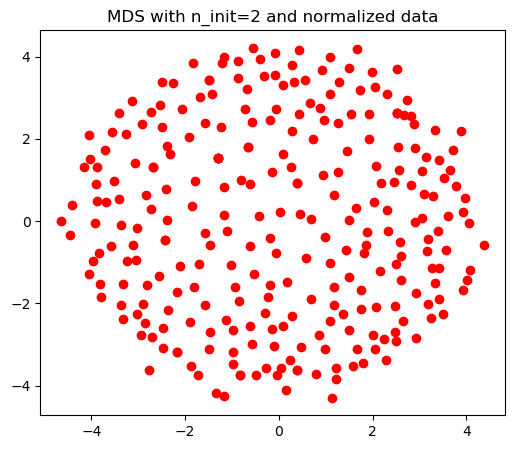

2
3


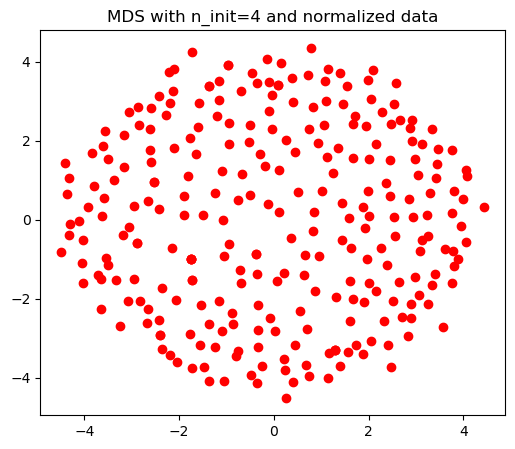

4
5
6
7


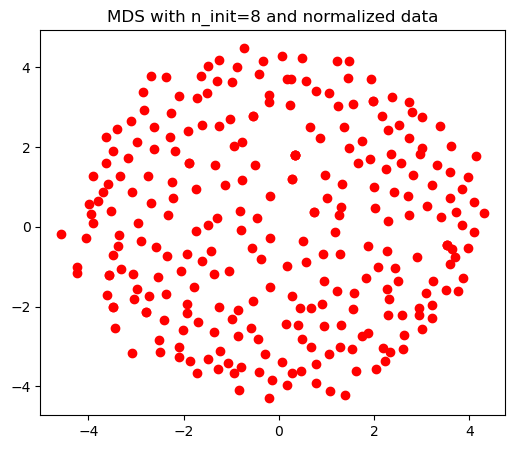

8
9
10
11


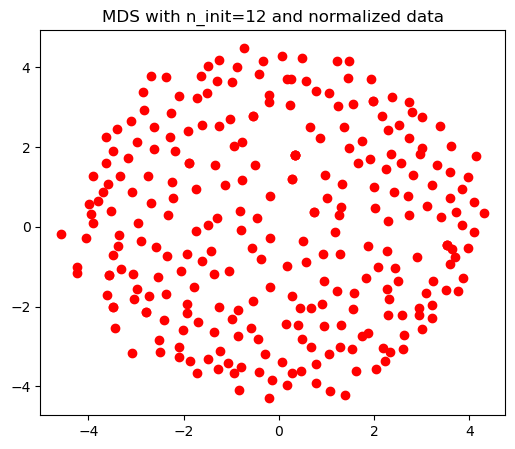

In [35]:
video_names = list(data_caption.keys())
n_init_values_selected = [1, 2, 4, 8, 12]
n_init_values_full = list(range(1, 13))

for scale_type in ['standardized', 'normalized']:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(n_init_values_full), len(video_names), len(video_names)))

    for i, n_init in enumerate(n_init_values_full):

        embeddings = np.array([data_caption[video_name][scale_type] for video_name in video_names])

        md_scaling = manifold.MDS(
            n_components=2,
            max_iter=2000,
            n_init=n_init,
            random_state=0,
            normalized_stress=False,
        )
        S_scaling = md_scaling.fit_transform(embeddings)

        # Compute the distance matrix and save it to the 3D array
        distance_matrix = pairwise_distances(S_scaling)
        # Normalize the distance matrix
        distance_matrix = distance_matrix / distance_matrix.max()
        distance_matrices[i] = distance_matrix

        # Visualize the 2D embeddings for the selected n_init values
        if n_init in n_init_values_selected:
            plt.figure(figsize=(6, 5))
            plt.scatter(S_scaling[:, 0], S_scaling[:, 1], color='red')
            plt.title(f'MDS with n_init={n_init} and {scale_type} data')
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'caption_average_distance_matrix_mds_{scale_type}_full.csv')

    # Get the indices of the selected n_init values in the full range
    selected_indices = [n_init_values_full.index(n_init) for n_init in n_init_values_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected n_init values
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'caption_average_distance_matrix_mds_{scale_type}_selected.csv')

[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


[t-SNE] Computed neighbors for 275 samples in 0.384s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.966591
[t-SNE] KL divergence after 5000 iterations: 0.429040


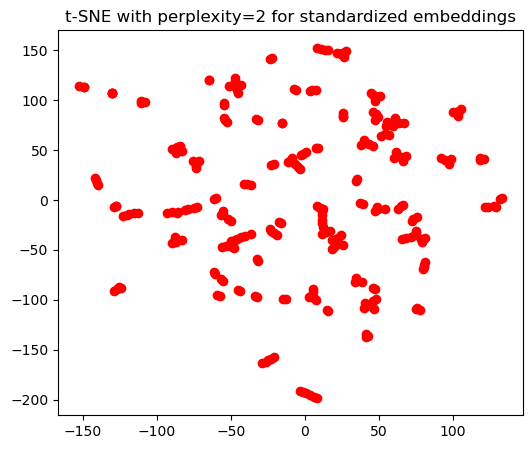

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.001s...
[t-SNE] Computed neighbors for 275 samples in 0.059s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 4.451921
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.461479
[t-SNE] KL divergence after 5000 iterations: 0.532309
[t-SNE] Computing 13 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.024s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 6.016520
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.990234
[t-SNE] KL divergence after 5000 iterations: 0.668721
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.023s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 6.560566
[t-SNE] KL divergence after 250 iteratio

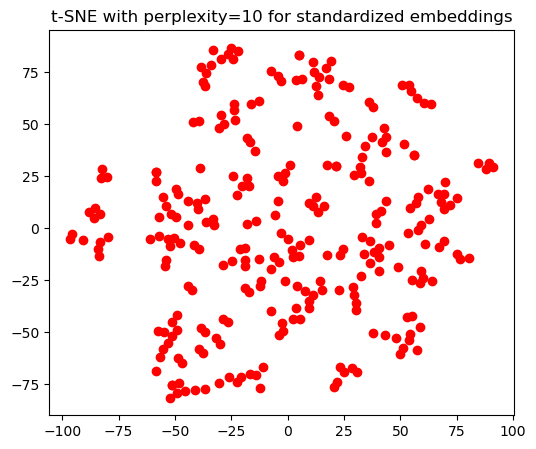

[t-SNE] Computing 34 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.001s...
[t-SNE] Computed neighbors for 275 samples in 0.029s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 7.864632
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.453636
[t-SNE] KL divergence after 5000 iterations: 0.864152
[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.107s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 7.974789
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.438103
[t-SNE] KL divergence after 5000 iterations: 0.848240
[t-SNE] Computing 40 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 8.071935
[t-SNE] KL divergence after 250 iteratio

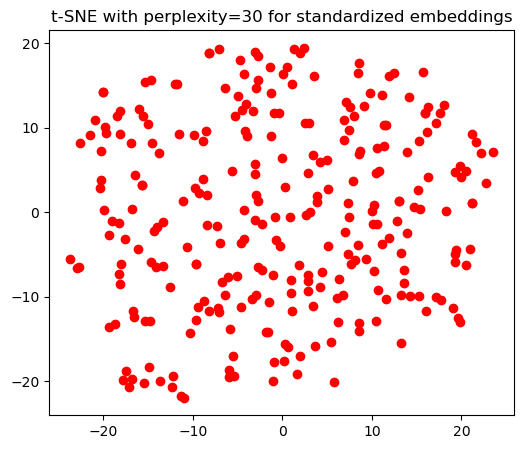

[t-SNE] Computing 94 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 8.949907
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.355927
[t-SNE] KL divergence after 3750 iterations: 0.790304
[t-SNE] Computing 97 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.038s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 8.977613
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.991585
[t-SNE] KL divergence after 3450 iterations: 0.776190
[t-SNE] Computing 100 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.019s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 9.004257
[t-SNE] KL divergence after 250 iterati

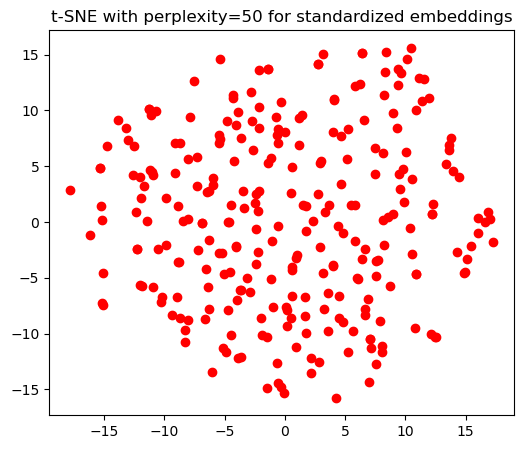

[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.001s...
[t-SNE] Computed neighbors for 275 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.832039
[t-SNE] KL divergence after 5000 iterations: 0.364343


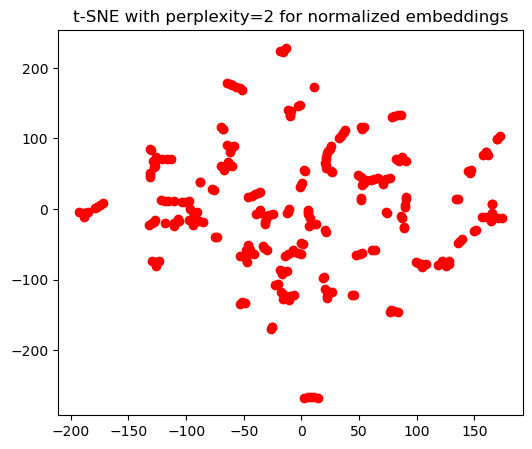

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.023s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.922805
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.162796
[t-SNE] KL divergence after 5000 iterations: 0.553228
[t-SNE] Computing 13 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.023s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 1.075850
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.618294
[t-SNE] KL divergence after 5000 iterations: 0.586368
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.023s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 1.179236
[t-SNE] KL divergence after 250 iteratio

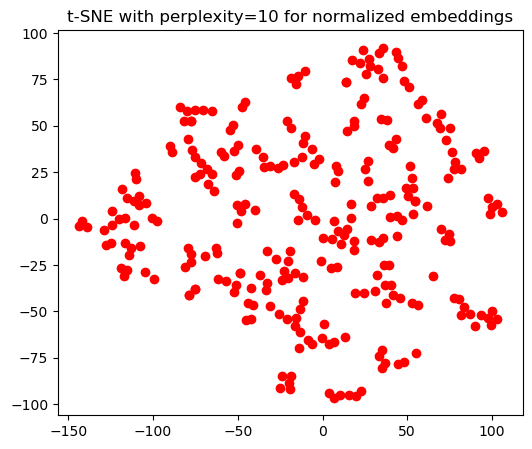

[t-SNE] Computing 34 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.043s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 1.414773
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.495171
[t-SNE] KL divergence after 5000 iterations: 0.838868
[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.025s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 1.434843
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.481163
[t-SNE] KL divergence after 5000 iterations: 0.854013
[t-SNE] Computing 40 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.024s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 1.452508
[t-SNE] KL divergence after 250 iteratio

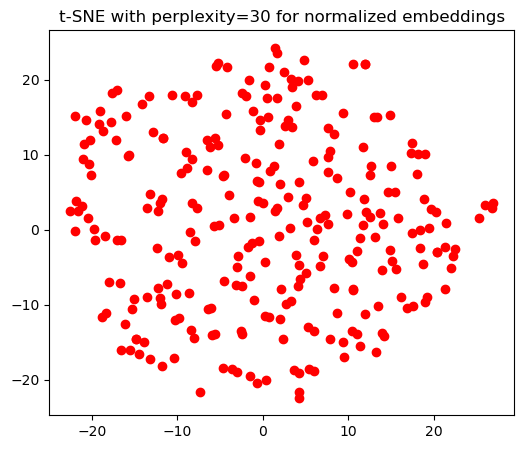

[t-SNE] Computing 94 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.038s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 1.612973
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.403461
[t-SNE] KL divergence after 2900 iterations: 0.786536
[t-SNE] Computing 97 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 1.618021
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.036659
[t-SNE] KL divergence after 5000 iterations: 0.770478
[t-SNE] Computing 100 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.019s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 1.622877
[t-SNE] KL divergence after 250 iterati

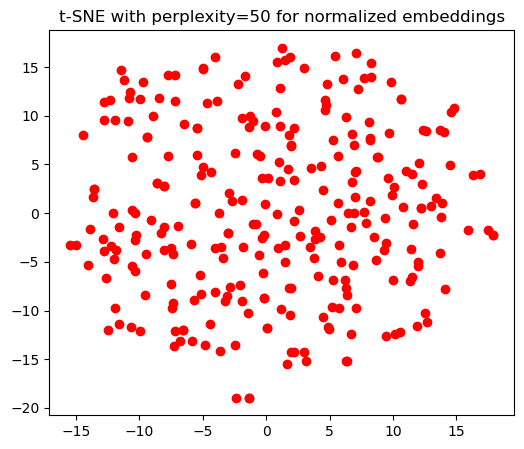

In [36]:
video_names = list(data_caption.keys())
perplexities_selected = [2,10,30,50]
perplexities_full = list(range(2, 51))

for scale_type in ['standardized', 'normalized']:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(perplexities_full), len(video_names), len(video_names)))

    for i, perplex in enumerate(perplexities_full):
        embeddings = np.array([data_caption[video_name][scale_type] for video_name in video_names])

        tsne = TSNE(n_components=2, random_state=0, learning_rate=30, perplexity=perplex, n_iter=5000, n_iter_without_progress=300, verbose=1)
        embedding_2D = tsne.fit_transform(embeddings)

        # Compute the distance matrix
        distance_matrix = pairwise_distances(embedding_2D)

        # Normalize the distance matrix
        distance_matrix = distance_matrix / distance_matrix.max()

        # Save the normalized distance matrix to the 3D array
        distance_matrices[i] = distance_matrix

        # Visualize the result for the selected perplexities
        if perplex in perplexities_selected:
            plt.figure(figsize=(6, 5))
            for point, counter in zip(embedding_2D, embeddings):
                plt.scatter(point[0], point[1], color='red')
            plt.title(f"t-SNE with perplexity={perplex} for {scale_type} embeddings")
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'caption_average_distance_matrix_tsne_{scale_type}_full.csv')

    # Get the indices of the selected perplexities in the full range
    selected_indices = [perplexities_full.index(perplex) for perplex in perplexities_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected perplexities
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'caption_average_distance_matrix_tsne_{scale_type}_selected.csv')

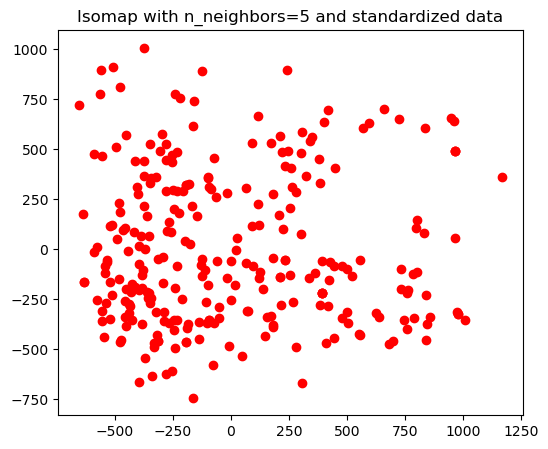

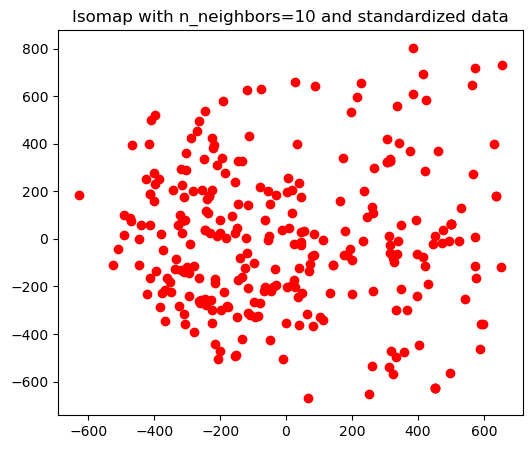

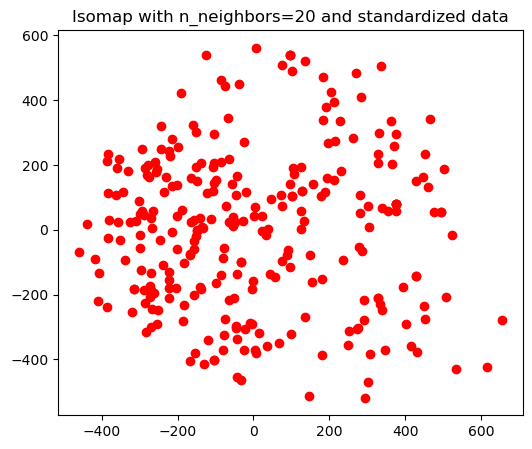

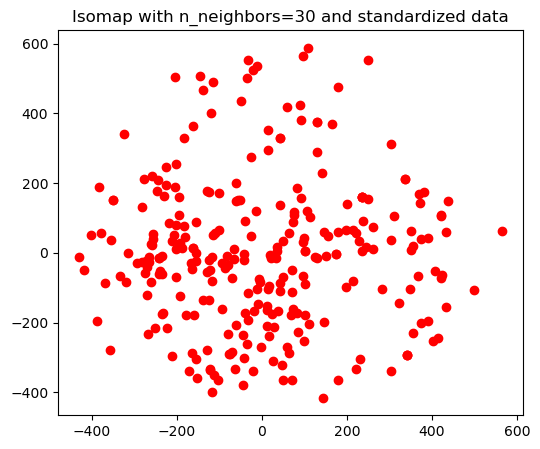

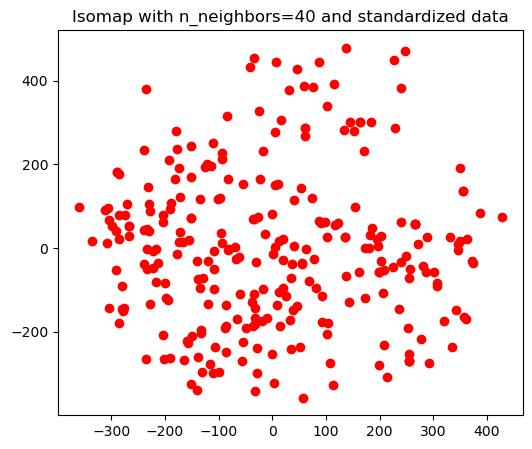

...

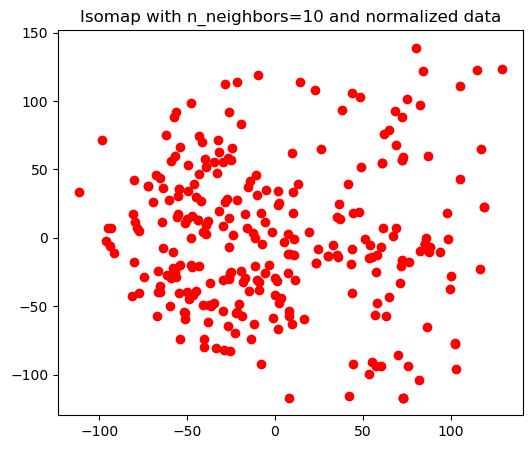

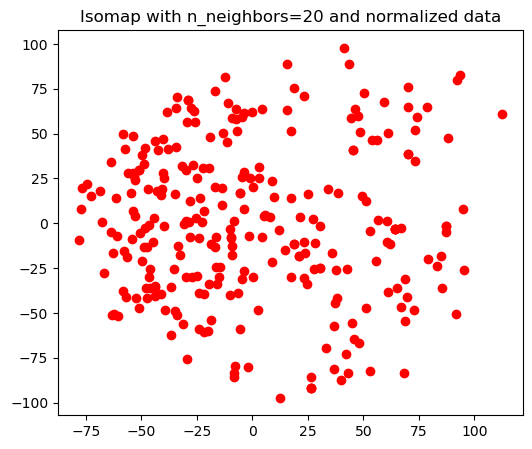

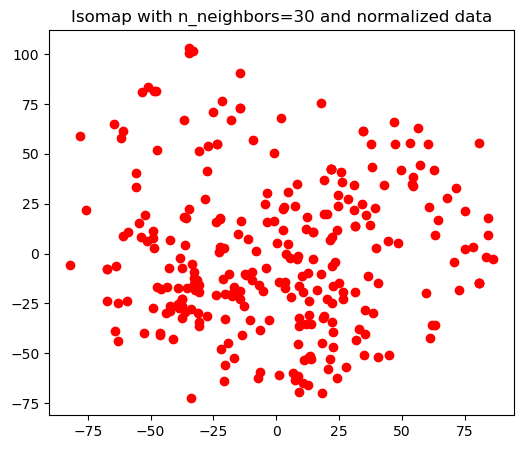

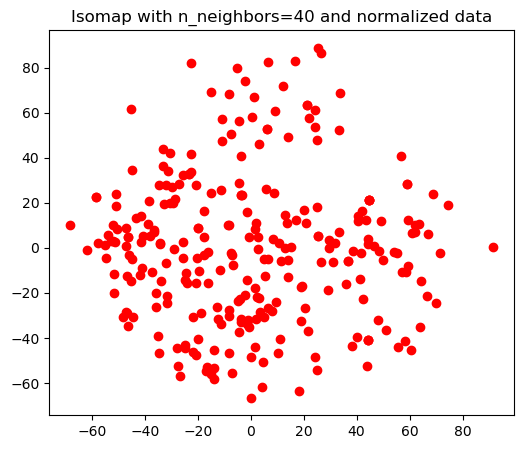

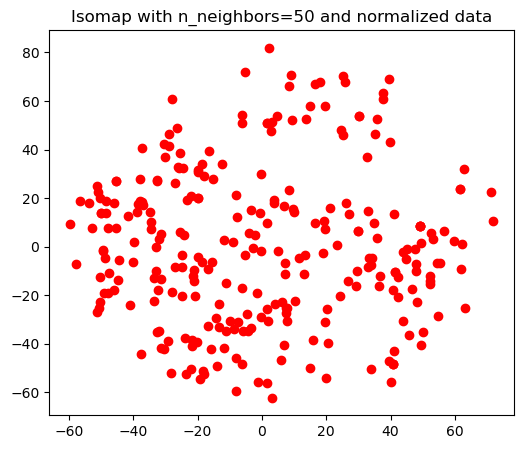

In [37]:
video_names = list(data_caption.keys())
n_neighbors_values_selected = [5,10,20,30,40,50]
n_neighbors_values_full = list(range(5, 51))

for scale_type in ['standardized', 'normalized']:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(n_neighbors_values_full), len(video_names), len(video_names)))

    for i, n_neighbors in enumerate(n_neighbors_values_full):
        embeddings = np.array([data_caption[video_name][scale_type] for video_name in video_names])

        isomap = manifold.Isomap(n_neighbors=n_neighbors, n_components=2, p=1)
        S_isomap = isomap.fit_transform(embeddings)

        # Compute the distance matrix and save it to the 3D array
        distance_matrix = pairwise_distances(S_isomap)
        distance_matrix = distance_matrix/distance_matrix.max()
        distance_matrices[i] = distance_matrix

        # Visualize the 2D embeddings for the selected n_neighbors values
        if n_neighbors in n_neighbors_values_selected:
            plt.figure(figsize=(6, 5))
            plt.scatter(S_isomap[:, 0], S_isomap[:, 1], color='red')
            plt.title(f'Isomap with n_neighbors={n_neighbors} and {scale_type} data')
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'caption_average_distance_matrix_isomap_{scale_type}_full.csv')

    # Get the indices of the selected n_neighbors values in the full range
    selected_indices = [n_neighbors_values_full.index(n_neighbors) for n_neighbors in n_neighbors_values_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected n_neighbors values
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'caption_average_distance_matrix_isomap_{scale_type}_selected.csv')

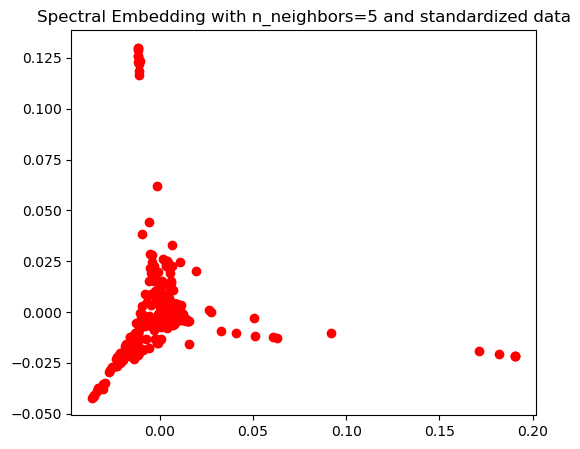

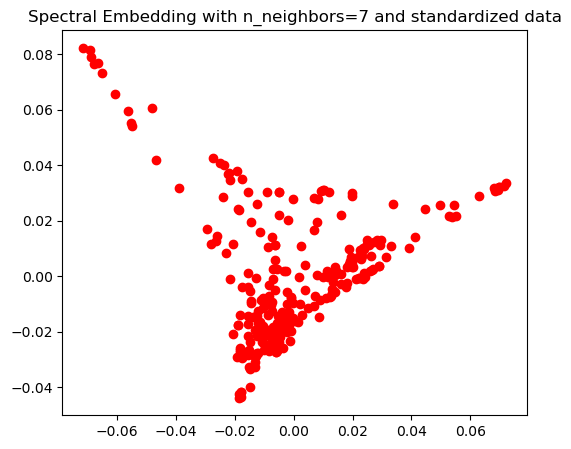

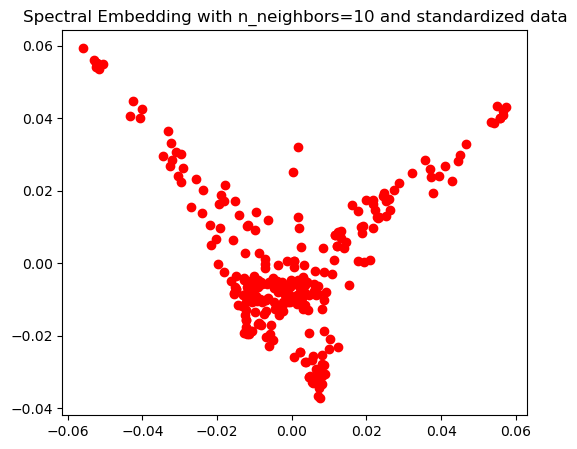

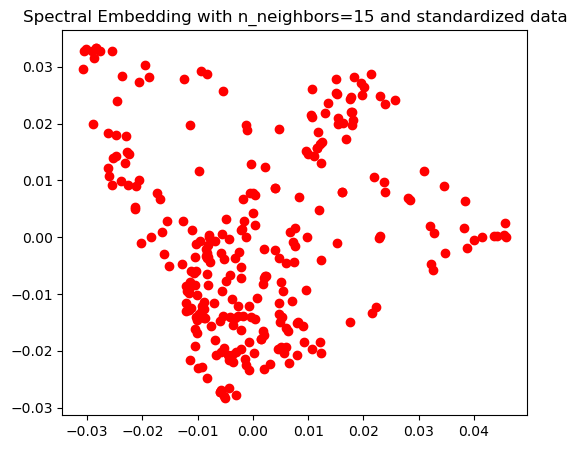

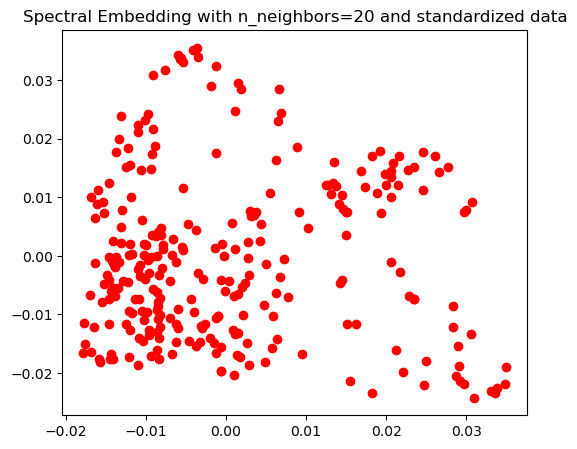

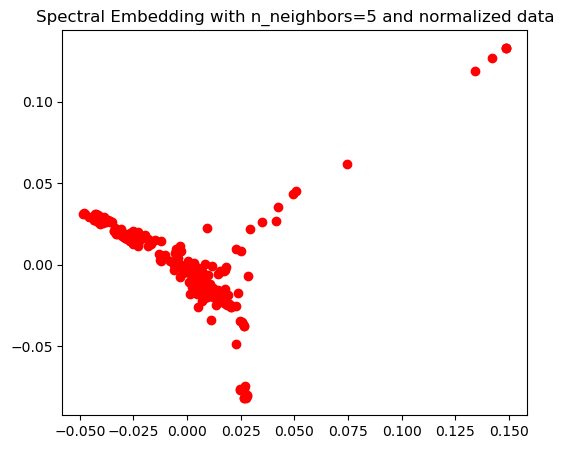

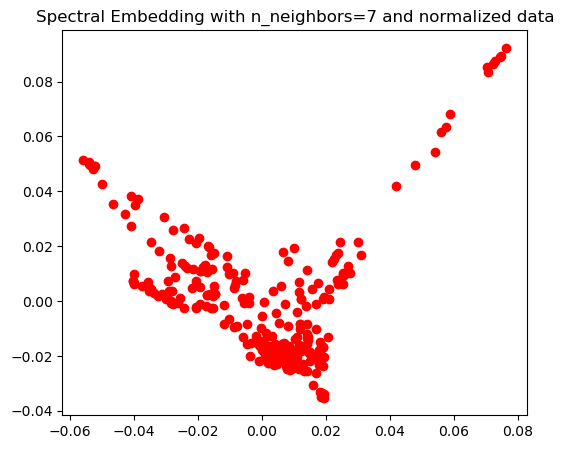

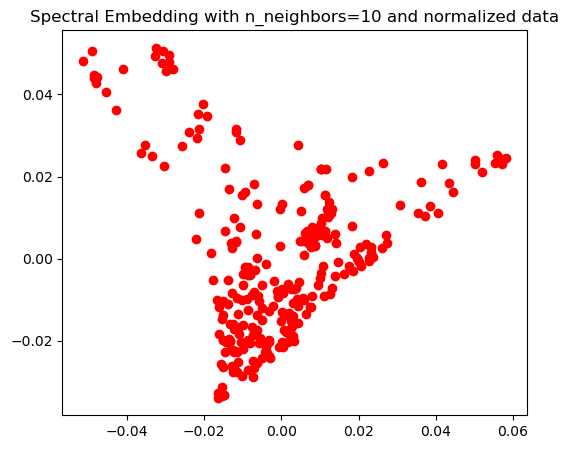

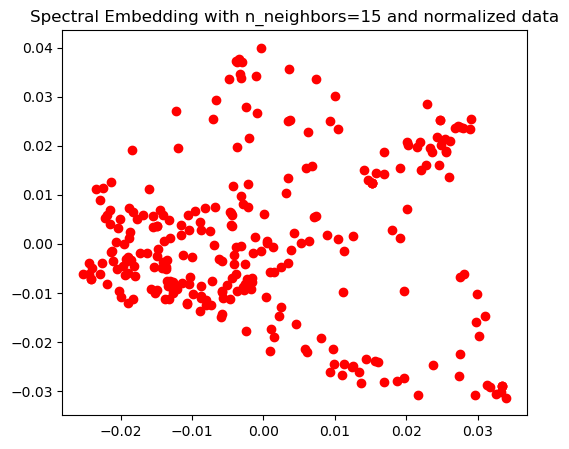

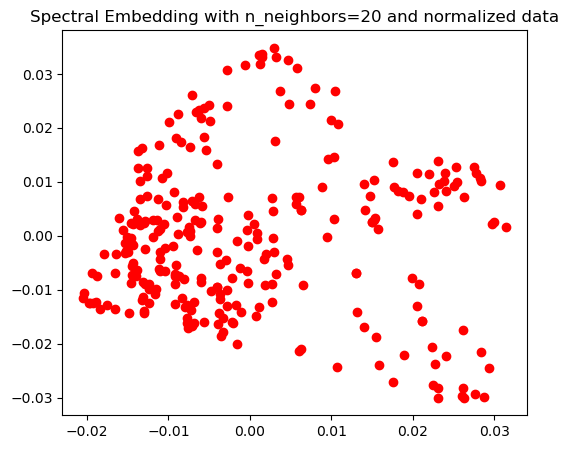

In [38]:
video_names = list(data_caption.keys())
n_neighbors_values_selected = [5,7,10,15,20]
n_neighbors_values_full = list(range(5, 21))

for scale_type in ['standardized', 'normalized']:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(n_neighbors_values_full), len(video_names), len(video_names)))

    for i, n_neighbors in enumerate(n_neighbors_values_full):
        embeddings = np.array([data_caption[video_name][scale_type] for video_name in video_names])

        spectral = manifold.SpectralEmbedding(n_components=2, n_neighbors=n_neighbors, random_state=42)
        S_spectral = spectral.fit_transform(embeddings)

        # Compute the distance matrix and save it to the 3D array
        distance_matrix = pairwise_distances(S_spectral)
        distance_matrix = distance_matrix/distance_matrix.max()
        distance_matrices[i] = distance_matrix

        # Visualize the 2D embeddings for the selected n_neighbors values
        if n_neighbors in n_neighbors_values_selected:
            plt.figure(figsize=(6, 5))
            plt.scatter(S_spectral[:, 0], S_spectral[:, 1], color='red')
            plt.title(f'Spectral Embedding with n_neighbors={n_neighbors} and {scale_type} data')
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'caption_average_distance_matrix_spectral_{scale_type}_full.csv')

    # Get the indices of the selected n_neighbors values in the full range
    selected_indices = [n_neighbors_values_full.index(n_neighbors) for n_neighbors in n_neighbors_values_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected n_neighbors values
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'caption_average_distance_matrix_spectral_{scale_type}_selected.csv')

In [46]:

# List of CSV files
csv_files = ['caption_average_distance_matrix_tsne_standardized_full.csv', 
             'caption_average_distance_matrix_tsne_normalized_full.csv', 
             'caption_average_distance_matrix_isomap_standardized_full.csv', 
             'caption_average_distance_matrix_isomap_normalized_full.csv',
             'caption_average_distance_matrix_spectral_standardized_full.csv',
             'caption_average_distance_matrix_spectral_normalized_full.csv',
             'caption_average_distance_matrix_mds_standardized_full.csv',
             'caption_average_distance_matrix_mds_normalized_full.csv']

# Load the CSV files into DataFrames
dataframes = [pd.read_csv(file, index_col=0) for file in csv_files]

# Create empty DataFrames to store the flattened DataFrames
flattened_dfs_normalized = pd.DataFrame()
flattened_dfs_standardized = pd.DataFrame()
# Perform correlation analysis
for i, df1 in enumerate(dataframes):
    # Extract method name and scalar type from file names
    method_name, scalar_type = csv_files[i].split('_')[4], csv_files[i].split('_')[5].split('.')[0]

    # Flatten the DataFrame into a 1D array
    array = df1.values.flatten()

    # Store the array in the appropriate DataFrame
    if scalar_type == 'normalized':
        flattened_dfs_normalized[method_name] = array
    elif scalar_type == 'standardized':
        flattened_dfs_standardized[method_name] = array  # Corrected this line

# Compute the correlation matrices
correlation_matrix_normalized = flattened_dfs_normalized.corr()
correlation_matrix_standardized = flattened_dfs_standardized.corr()

# Print the correlation matrices
print('Correlation matrix for normalized data:')
print(correlation_matrix_normalized)
print('\nCorrelation matrix for standardized data:')
print(correlation_matrix_standardized)

Correlation matrix for normalized data:
              tsne    isomap  spectral       mds
tsne      1.000000  0.660679  0.728750  0.648430
isomap    0.660679  1.000000  0.780554  0.747982
spectral  0.728750  0.780554  1.000000  0.586904
mds       0.648430  0.747982  0.586904  1.000000

Correlation matrix for standardized data:
              tsne    isomap  spectral       mds
tsne      1.000000  0.670612  0.715781  0.659587
isomap    0.670612  1.000000  0.739918  0.761147
spectral  0.715781  0.739918  1.000000  0.572753
mds       0.659587  0.761147  0.572753  1.000000


In [48]:
# List of CSV files for 'selected' data
csv_files_selected = ['caption_average_distance_matrix_tsne_standardized_selected.csv', 
                      'caption_average_distance_matrix_tsne_normalized_selected.csv', 
                      'caption_average_distance_matrix_isomap_standardized_selected.csv', 
                      'caption_average_distance_matrix_isomap_normalized_selected.csv',
                      'caption_average_distance_matrix_spectral_standardized_selected.csv',
                      'caption_average_distance_matrix_spectral_normalized_selected.csv',
                      'caption_average_distance_matrix_mds_standardized_selected.csv',
                      'caption_average_distance_matrix_mds_normalized_selected.csv']

# Load the CSV files into DataFrames
dataframes_selected = [pd.read_csv(file, index_col=0) for file in csv_files_selected]

# Create empty DataFrames to store the flattened DataFrames
flattened_dfs_normalized_selected = pd.DataFrame()
flattened_dfs_standardized_selected = pd.DataFrame()

# Perform correlation analysis for 'selected' data
for i, df1 in enumerate(dataframes_selected):
    # Extract method name and scalar type from file names
    method_name, scalar_type = csv_files_selected[i].split('_')[4], csv_files_selected[i].split('_')[5].split('.')[0]

    # Flatten the DataFrame into a 1D array
    array = df1.values.flatten()

    # Store the array in the appropriate DataFrame
    if scalar_type == 'normalized':
        flattened_dfs_normalized_selected[method_name] = array
    elif scalar_type == 'standardized':
        flattened_dfs_standardized_selected[method_name] = array

# Compute the correlation matrices for 'selected' data
correlation_matrix_normalized_selected = flattened_dfs_normalized_selected.corr()
correlation_matrix_standardized_selected = flattened_dfs_standardized_selected.corr()

# Print the correlation matrices for 'selected' data
print('Correlation matrix for normalized selected data:')
print(correlation_matrix_normalized_selected)
print('\nCorrelation matrix for standardized selected data:')
print(correlation_matrix_standardized_selected)

# Compute the correlation between 'full' and 'selected' data
correlation_full_selected_normalized = correlation_matrix_normalized.corrwith(correlation_matrix_normalized_selected)
correlation_full_selected_standardized = correlation_matrix_standardized.corrwith(correlation_matrix_standardized_selected)

# Print the correlation between 'full' and 'selected' data
print('\nCorrelation between full and selected normalized data:')
print(correlation_full_selected_normalized)
print('\nCorrelation between full and selected standardized data:')
print(correlation_full_selected_standardized)

Correlation matrix for normalized selected data:
              tsne    isomap  spectral       mds
tsne      1.000000  0.594889  0.656210  0.609788
isomap    0.594889  1.000000  0.747099  0.739265
spectral  0.656210  0.747099  1.000000  0.568869
mds       0.609788  0.739265  0.568869  1.000000

Correlation matrix for standardized selected data:
              tsne    isomap  spectral       mds
tsne      1.000000  0.636428  0.649039  0.647240
isomap    0.636428  1.000000  0.733915  0.760707
spectral  0.649039  0.733915  1.000000  0.541335
mds       0.647240  0.760707  0.541335  1.000000

Correlation between full and selected normalized data:
tsne        0.994727
isomap      0.994011
spectral    0.988435
mds         0.998299
dtype: float64

Correlation between full and selected standardized data:
tsne        0.990168
isomap      0.996764
spectral    0.991373
mds         0.999035
dtype: float64


# CHAPTER KEYPOINTS

In [52]:
def load_keypoints_from_hdf5(filename):
    """
    Load the keypoints from an HDF5 file.

    Args:
        filename (str): The name of the HDF5 file to load.

    Returns:
        keypoints (list of dict): A list of dictionaries representing the keypoints.
    """
    keypoints = []
    with h5py.File(filename, 'r') as f:
        for group_name in f:
            group = f[group_name]
            frame = {key: np.array(dataset) for key, dataset in group.items()}
            keypoints.append(frame)
    return keypoints

In [49]:
keypoint_maps = get_dirs_with_subdir(maps, 'keypoints')

In [51]:
keypoints_label_mapping = [
        "nose", "left_eye", "right_eye", "left_ear", "right_ear",
        "left_shoulder", "right_shoulder", "left_elbow", "right_elbow",
        "left_wrist", "right_wrist", "left_hip", "right_hip",
        "left_knee", "right_knee", "left_ankle", "right_ankle",
    ]

In [55]:
data_keypoints = {}
import h5py

for video_name in tqdm(keypoint_maps):
    # Load depth map from HDF5 file
    hdf5_files = find_files(video_name, 'keypoints', 'hdf5')
    if hdf5_files:
        keypoints_map = load_keypoints_from_hdf5(hdf5_files[0])
        data_keypoints[video_name] = keypoints_map
    else:
        txt_files = find_files(video_name, 'keypoints', 'txt')
        if txt_files:
            data_keypoints[video_name] = []
        else:
            print(f'No video {video_name} ')

print(len(data_keypoints.keys()))


100%|██████████| 274/274 [00:38<00:00,  7.09it/s]

274


In [68]:
for video, values in data_keypoints.items():
    print(video)
    for frame in values:
        keypoints_list = frame['keypoints']
        keypoints_scores_list = frame['keypoints_scores']
        if keypoints_list.size > 0 and keypoints_scores_list.size > 0:  # Check if arrays are not empty
            for keypoints, keypoints_scores in zip(keypoints_list, keypoints_scores_list):
                for kp, score in zip(keypoints, keypoints_scores):
                    if score < 8:
                        kp[2] = 0  # Set the visibility flag to 0

/tank/tgn252/metadata_annotations/result/R_S_yt--jzScB82vKI_212.mp4
/tank/tgn252/metadata_annotations/result/S_yt-3V8US8ZD3NU_229.mp4
/tank/tgn252/metadata_annotations/result/S_yt-tMP5WhHMtWE_55.mp4
/tank/tgn252/metadata_annotations/result/S_production_ID_5102663.mp4
/tank/tgn252/metadata_annotations/result/S_yt-Lbv4qHp0RO0_14.mp4
/tank/tgn252/metadata_annotations/result/R_S_yt-H2ce6U0SbVA_542.mp4
/tank/tgn252/metadata_annotations/result/R_S_yt-FoO02U39gy4_398.mp4
/tank/tgn252/metadata_annotations/result/R_S_yt-aiDGx4AN8J0_9.mp4
/tank/tgn252/metadata_annotations/result/S_yt-Ozx_f0a0ZDI_32.mp4
/tank/tgn252/metadata_annotations/result/R_S_pexels-c-technical-5771610.mp4
/tank/tgn252/metadata_annotations/result/R_S_comp_DB_D001_C001_PSNK_v06_SDR_PS_20180824_SDR_2K_AVC.mp4
/tank/tgn252/metadata_annotations/result/R_S_yt-UmLeGNcqouI_718.mp4
/tank/tgn252/metadata_annotations/result/S_wc-TAGpcap1KdAS_212.mp4
/tank/tgn252/metadata_annotations/result/S_yt-ZTAaH5XbtfE_3.mp4
/tank/tgn252/metadata_

In [81]:
for video, values in data_keypoints.items():
    visible_keypoints_count = 0
    for frame in values:
        keypoints_list = frame['keypoints']
        if keypoints_list.size > 0:  # Check if array is not empty
            for keypoints in keypoints_list:
                for kp in keypoints:
                    if kp[2] == 1:  # Check if the visibility flag is 1
                        visible_keypoints_count += 1
    print(f"Total number of visible keypoints in video {video}: {visible_keypoints_count}")

Total number of visible keypoints in video /tank/tgn252/metadata_annotations/result/R_S_yt--jzScB82vKI_212.mp4: 1
Total number of visible keypoints in video /tank/tgn252/metadata_annotations/result/S_yt-3V8US8ZD3NU_229.mp4: 97
Total number of visible keypoints in video /tank/tgn252/metadata_annotations/result/S_yt-tMP5WhHMtWE_55.mp4: 12
Total number of visible keypoints in video /tank/tgn252/metadata_annotations/result/S_production_ID_5102663.mp4: 1934
Total number of visible keypoints in video /tank/tgn252/metadata_annotations/result/S_yt-Lbv4qHp0RO0_14.mp4: 0
Total number of visible keypoints in video /tank/tgn252/metadata_annotations/result/R_S_yt-H2ce6U0SbVA_542.mp4: 2807
Total number of visible keypoints in video /tank/tgn252/metadata_annotations/result/R_S_yt-FoO02U39gy4_398.mp4: 6
Total number of visible keypoints in video /tank/tgn252/metadata_annotations/result/R_S_yt-aiDGx4AN8J0_9.mp4: 0
Total number of visible keypoints in video /tank/tgn252/metadata_annotations/result/S_yt-

In [75]:
for video, values in data_keypoints.items():
    keypoint_counts = [0]*17  # Initialize a list of 17 zeros
    for frame in values:
        keypoints_list = frame['keypoints']
        if keypoints_list.size > 0:  # Check if array is not empty
            for keypoints in keypoints_list:
                for i, kp in enumerate(keypoints):
                    if kp[2] == 1:  # Check if the visibility flag is 1
                        keypoint_counts[i] += 1
    if all(count == 0 for count in keypoint_counts):
        print(f"All keypoints in video {video} have visibility flag set to 0.")
        break

All keypoints in video /tank/tgn252/metadata_annotations/result/S_yt-Lbv4qHp0RO0_14.mp4 have visibility flag set to 0.


In [82]:
keypoint_counts_dict = {}  # Initialize an empty dictionary

for video, values in data_keypoints.items():
    keypoint_counts = [0]*17  # Initialize a list of 17 zeros
    for frame in values:
        keypoints_list = frame['keypoints']
        if keypoints_list.size > 0:  # Check if array is not empty
            for keypoints in keypoints_list:
                for i, kp in enumerate(keypoints):
                    if kp[2] == 1:  # Check if the visibility flag is 1
                        keypoint_counts[i] += 1
    keypoint_counts_dict[video] = keypoint_counts  # Add the count vector to the dictionary

print(keypoint_counts_dict)

{'/tank/tgn252/metadata_annotations/result/R_S_yt--jzScB82vKI_212.mp4': [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], '/tank/tgn252/metadata_annotations/result/S_yt-3V8US8ZD3NU_229.mp4': [31, 11, 14, 5, 16, 0, 0, 0, 0, 3, 17, 0, 0, 0, 0, 0, 0], '/tank/tgn252/metadata_annotations/result/S_yt-tMP5WhHMtWE_55.mp4': [2, 0, 2, 1, 3, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0], '/tank/tgn252/metadata_annotations/result/S_production_ID_5102663.mp4': [148, 148, 148, 130, 92, 90, 68, 117, 92, 114, 92, 141, 144, 113, 147, 44, 106], '/tank/tgn252/metadata_annotations/result/S_yt-Lbv4qHp0RO0_14.mp4': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], '/tank/tgn252/metadata_annotations/result/R_S_yt-H2ce6U0SbVA_542.mp4': [549, 570, 607, 516, 557, 1, 0, 1, 0, 4, 2, 0, 0, 0, 0, 0, 0], '/tank/tgn252/metadata_annotations/result/R_S_yt-FoO02U39gy4_398.mp4': [4, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], '/tank/tgn252/metadata_annotations/result/R_S_yt-aiDGx4AN8J0_9.mp4': [0, 0, 0, 0, 0, 0, 0, 0, 0

In [83]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Initialize scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()

# Extract all keypoint counts
all_keypoint_counts = np.array([keypoint_counts_dict[video_name] for video_name in keypoint_counts_dict.keys()])

# Standardize and normalize all keypoint counts
standardized_all_keypoint_counts = standard_scaler.fit_transform(all_keypoint_counts)
normalized_all_keypoint_counts = minmax_scaler.fit_transform(all_keypoint_counts)

# Store the standardized and normalized keypoint counts back into the dictionary
for i, video_name in enumerate(keypoint_counts_dict.keys()):
    keypoint_counts_dict[video_name] = {
        'original': all_keypoint_counts[i],
        'standardized': standardized_all_keypoint_counts[i],
        'normalized': normalized_all_keypoint_counts[i]
    }

In [80]:
len(video_names)

10

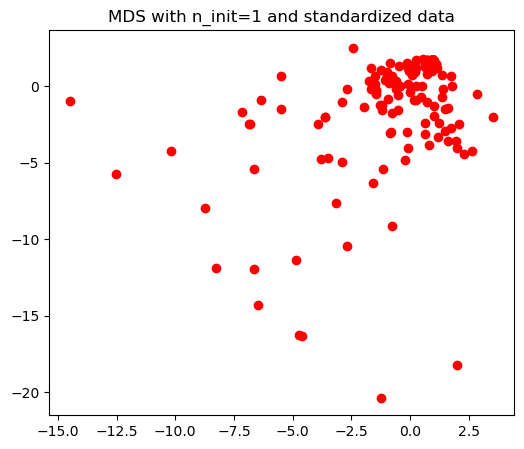

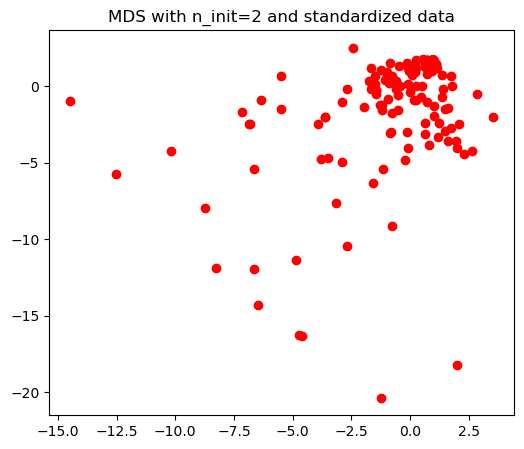

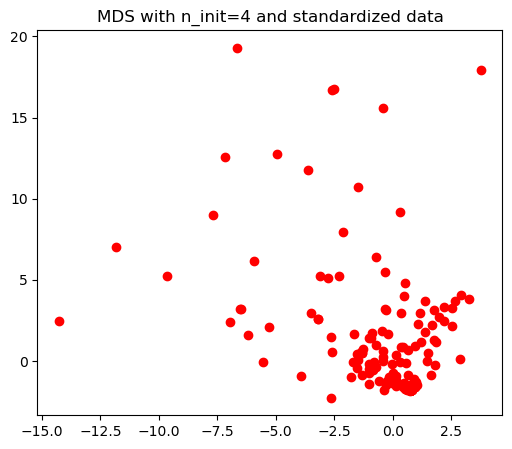

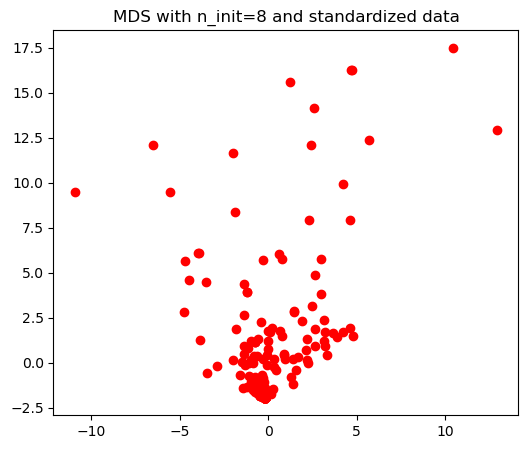

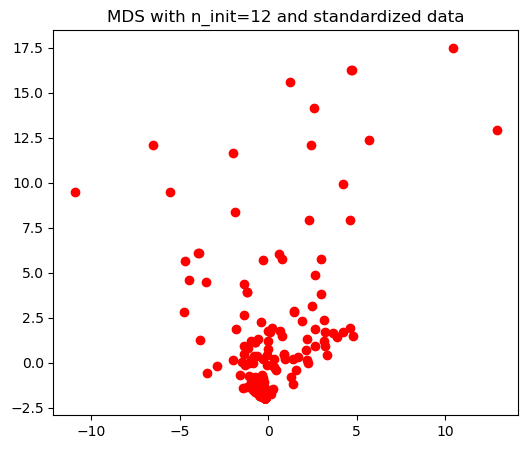

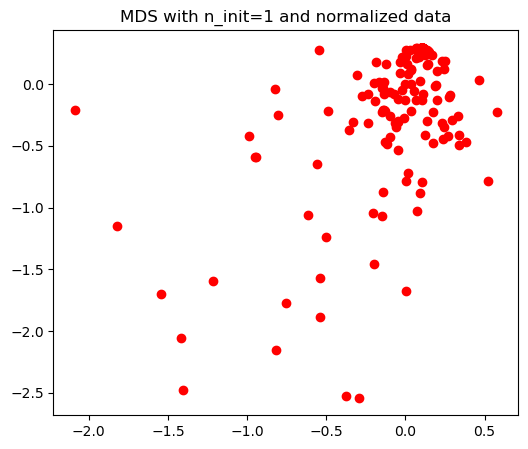

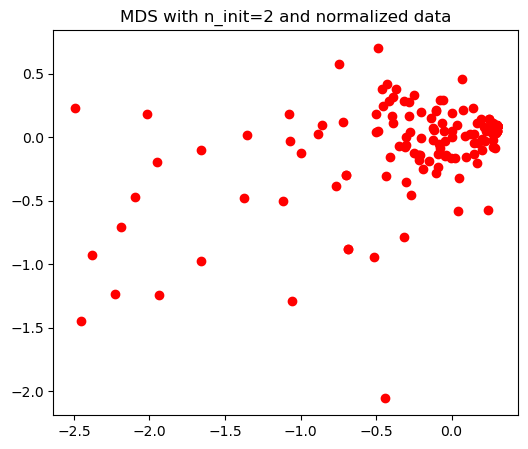

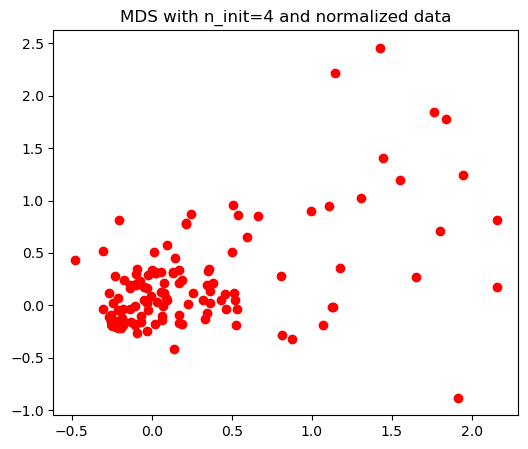

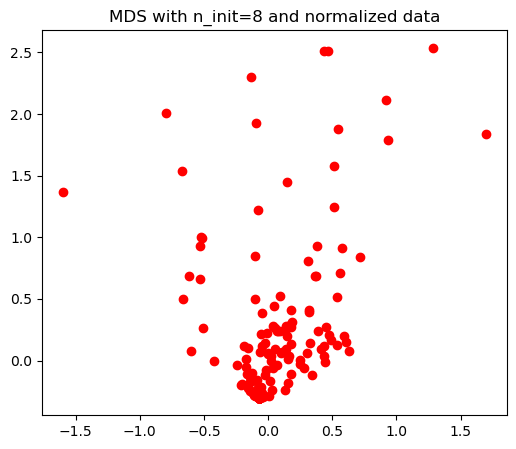

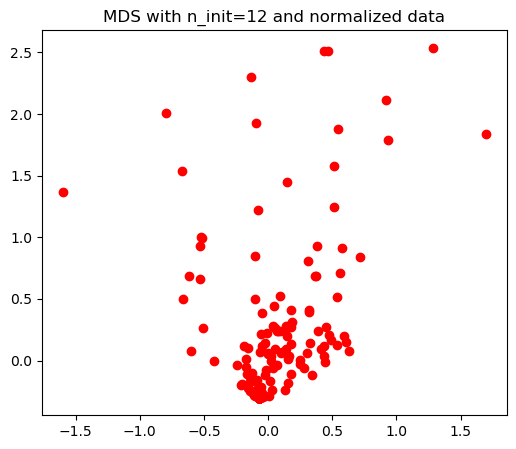

In [84]:
video_names = list(keypoint_counts_dict.keys())
n_init_values_selected = [1, 2, 4, 8, 12]
n_init_values_full = list(range(1, 13))

for scale_type in ['standardized', 'normalized']:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(n_init_values_full), len(video_names), len(video_names)))

    for i, n_init in enumerate(n_init_values_full):

        embeddings = np.array([keypoint_counts_dict[video_name][scale_type] for video_name in video_names])

        md_scaling = manifold.MDS(
            n_components=2,
            max_iter=2000,
            n_init=n_init,
            random_state=0,
            normalized_stress=False,
        )
        S_scaling = md_scaling.fit_transform(embeddings)

        # Compute the distance matrix and save it to the 3D array
        distance_matrix = pairwise_distances(S_scaling)
        # Normalize the distance matrix
        distance_matrix = distance_matrix / distance_matrix.max()
        distance_matrices[i] = distance_matrix

        # Visualize the 2D embeddings for the selected n_init values
        if n_init in n_init_values_selected:
            plt.figure(figsize=(6, 5))
            plt.scatter(S_scaling[:, 0], S_scaling[:, 1], color='red')
            plt.title(f'MDS with n_init={n_init} and {scale_type} data')
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'keypoint_average_distance_matrix_mds_{scale_type}_full.csv')

    # Get the indices of the selected n_init values in the full range
    selected_indices = [n_init_values_full.index(n_init) for n_init in n_init_values_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected n_init values
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'keypoint_average_distance_matrix_mds_{scale_type}_selected.csv')

[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.001s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.072014
[t-SNE] KL divergence after 5000 iterations: 0.361468


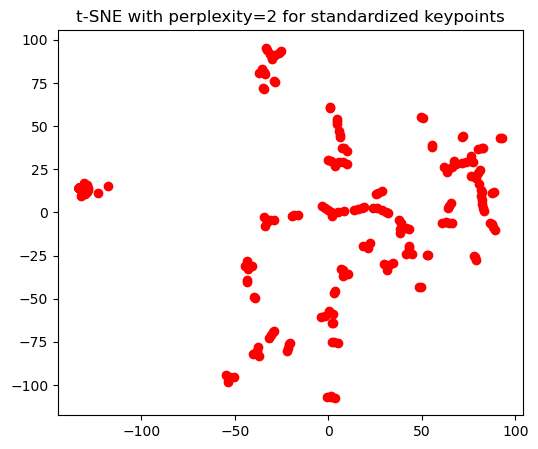

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.759369
[t-SNE] KL divergence after 5000 iterations: 0.400466
[t-SNE] Computing 13 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.001s...
[t-SNE] Computed neighbors for 274 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.643745
[t-SNE] KL divergence after 2750 iterations: 0.426564
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

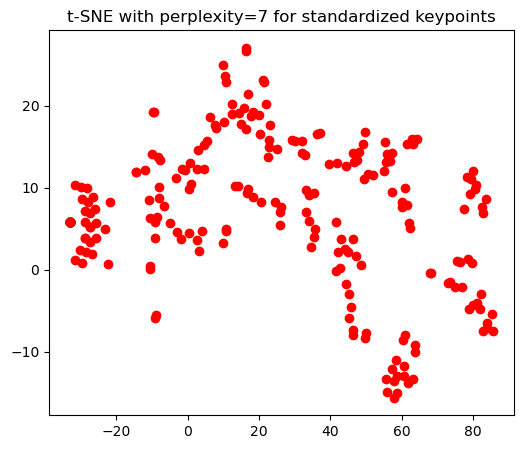

[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.337997
[t-SNE] KL divergence after 2800 iterations: 0.418303
[t-SNE] Computing 28 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.761173
[t-SNE] KL divergence after 4650 iterations: 0.414861
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

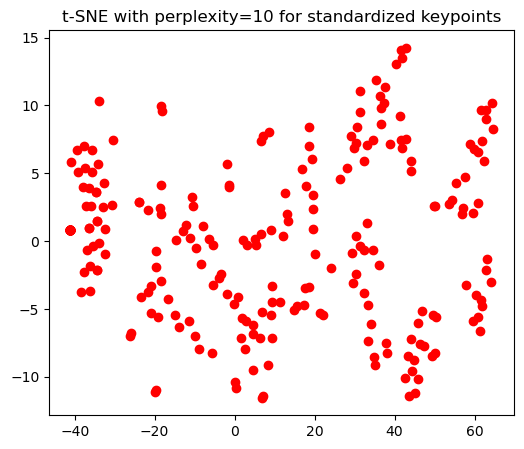

[t-SNE] Computing 34 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.940975
[t-SNE] KL divergence after 2200 iterations: 0.405339
[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.466217
[t-SNE] KL divergence after 1750 iterations: 0.400639
[t-SNE] Computing 40 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

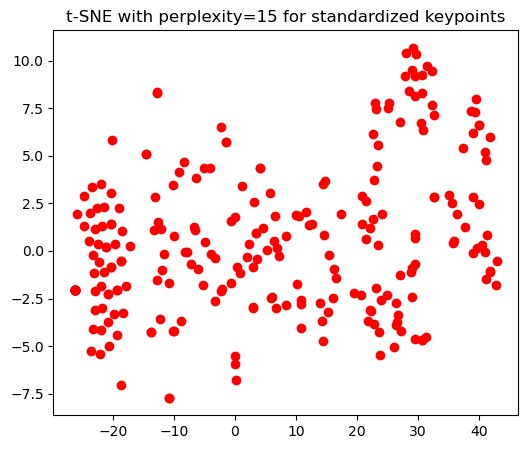

[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.039658
[t-SNE] KL divergence after 2000 iterations: 0.385620
[t-SNE] Computing 52 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.755798
[t-SNE] KL divergence after 1400 iterations: 0.398749
[t-SNE] Computing 55 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

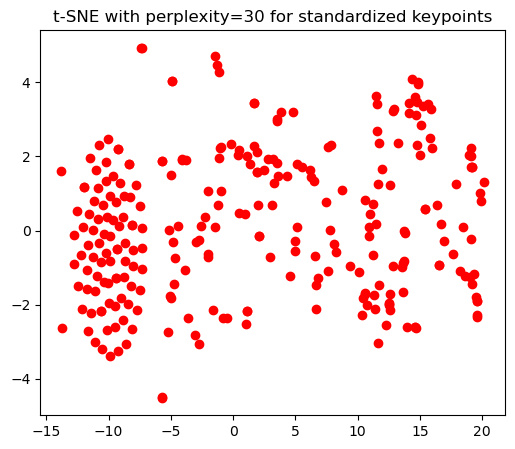

[t-SNE] Computing 94 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.035080
[t-SNE] KL divergence after 1300 iterations: 0.356845
[t-SNE] Computing 97 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.933083
[t-SNE] KL divergence after 1450 iterations: 0.355776
[t-SNE] Computing 100 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterati

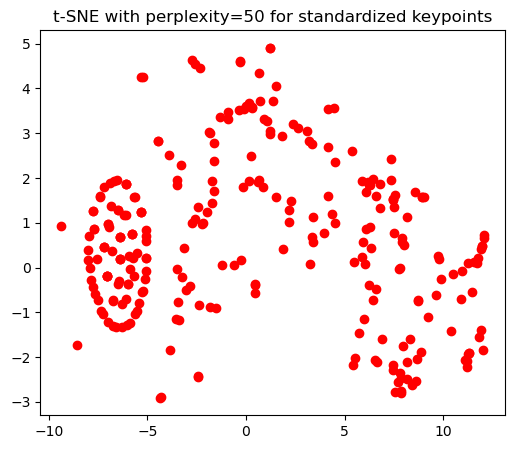

[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.001s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.985504
[t-SNE] KL divergence after 5000 iterations: 0.369175


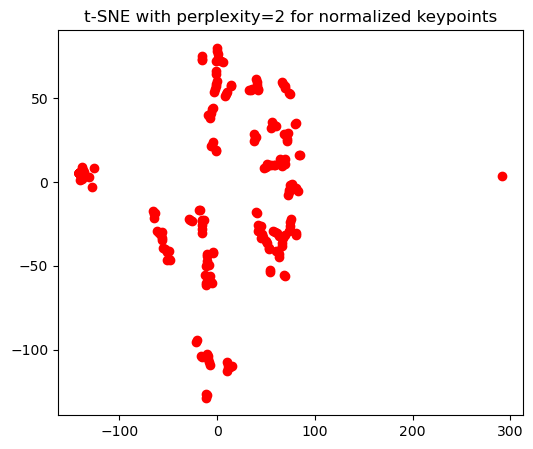

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.597160
[t-SNE] KL divergence after 5000 iterations: 0.392408
[t-SNE] Computing 13 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.924084
[t-SNE] KL divergence after 5000 iterations: 0.404435
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

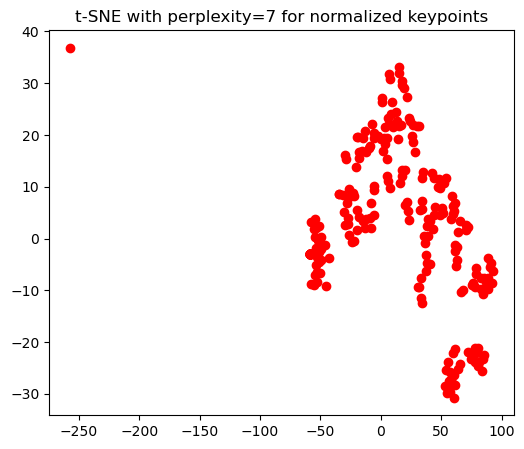

[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.020641
[t-SNE] KL divergence after 3300 iterations: 0.408348
[t-SNE] Computing 28 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.579128
[t-SNE] KL divergence after 2900 iterations: 0.418480
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

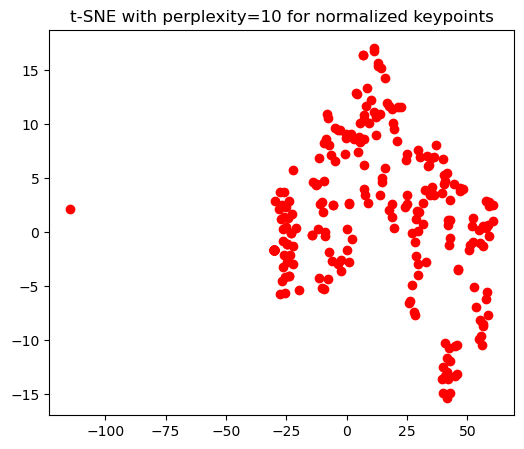

[t-SNE] Computing 34 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.788933
[t-SNE] KL divergence after 2800 iterations: 0.414427
[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.359325
[t-SNE] KL divergence after 1700 iterations: 0.413962
[t-SNE] Computing 40 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

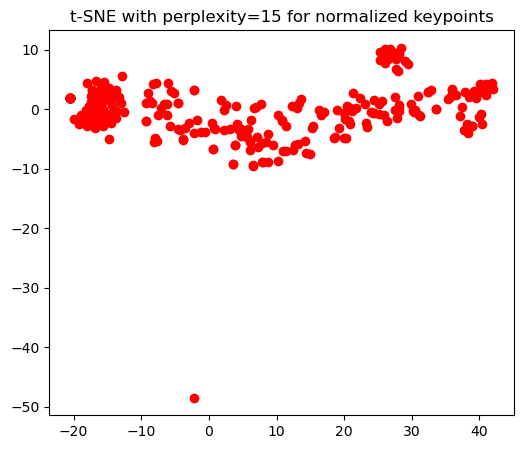

[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.976128
[t-SNE] KL divergence after 1550 iterations: 0.400273
[t-SNE] Computing 52 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.683289
[t-SNE] KL divergence after 1750 iterations: 0.393360
[t-SNE] Computing 55 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

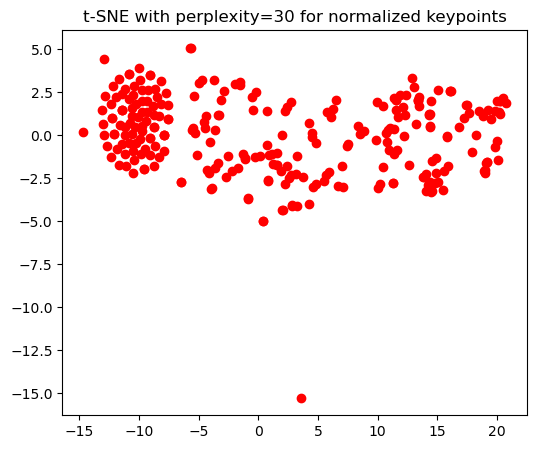

[t-SNE] Computing 94 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.666916
[t-SNE] KL divergence after 1450 iterations: 0.358557
[t-SNE] Computing 97 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.536572
[t-SNE] KL divergence after 1300 iterations: 0.352629
[t-SNE] Computing 100 nearest neighbors...
[t-SNE] Indexed 274 samples in 0.000s...
[t-SNE] Computed neighbors for 274 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 274 / 274
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterati

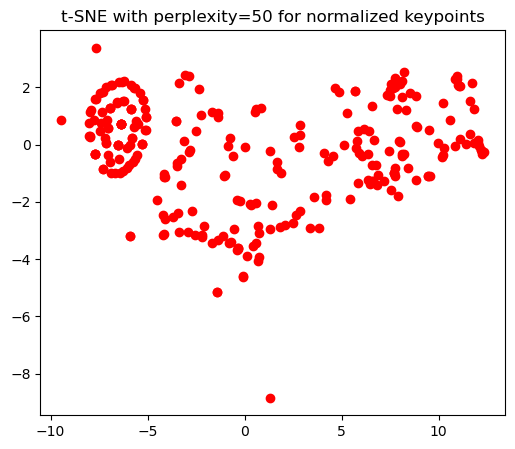

In [87]:
video_names = list(keypoint_counts_dict.keys())
perplexities_selected = [2,7,10,15,30,50]
perplexities_full = list(range(2, 51))

for scale_type in ['standardized', 'normalized']:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(perplexities_full), len(video_names), len(video_names)))

    for i, perplex in enumerate(perplexities_full):
        embeddings = np.array([keypoint_counts_dict[video_name][scale_type] for video_name in video_names])

        tsne = TSNE(n_components=2, random_state=0, learning_rate=30, perplexity=perplex, n_iter=5000, n_iter_without_progress=300, verbose=1)
        embedding_2D = tsne.fit_transform(embeddings)

        # Compute the distance matrix
        distance_matrix = pairwise_distances(embedding_2D)

        # Normalize the distance matrix
        distance_matrix = distance_matrix / distance_matrix.max()

        # Save the normalized distance matrix to the 3D array
        distance_matrices[i] = distance_matrix

        # Visualize the result for the selected perplexities
        if perplex in perplexities_selected:
            plt.figure(figsize=(6, 5))
            for point, counter in zip(embedding_2D, embeddings):
                plt.scatter(point[0], point[1], color='red')
            plt.title(f"t-SNE with perplexity={perplex} for {scale_type} keypoints")
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'keypoint_average_distance_matrix_tsne_{scale_type}_full.csv')

    # Get the indices of the selected perplexities in the full range
    selected_indices = [perplexities_full.index(perplex) for perplex in perplexities_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected perplexities
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'keypoint_average_distance_matrix_tsne_{scale_type}_selected.csv')


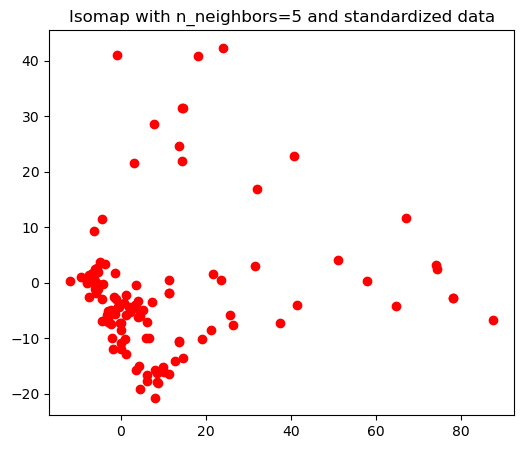

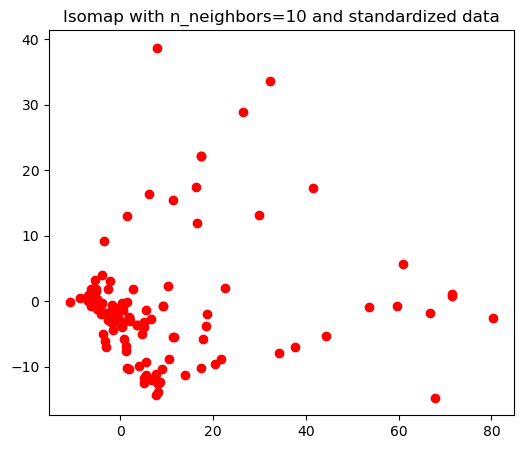

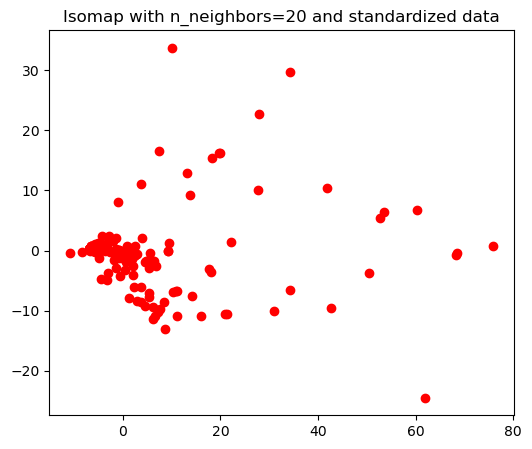

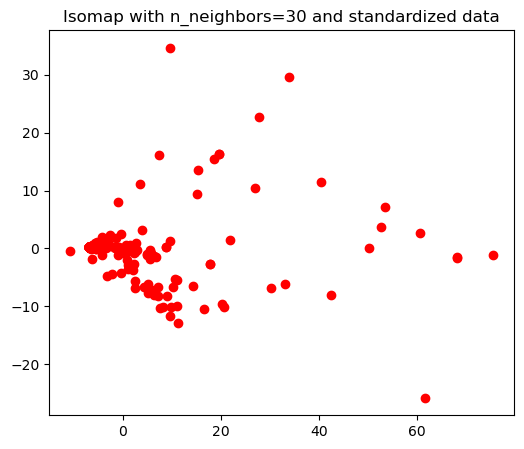

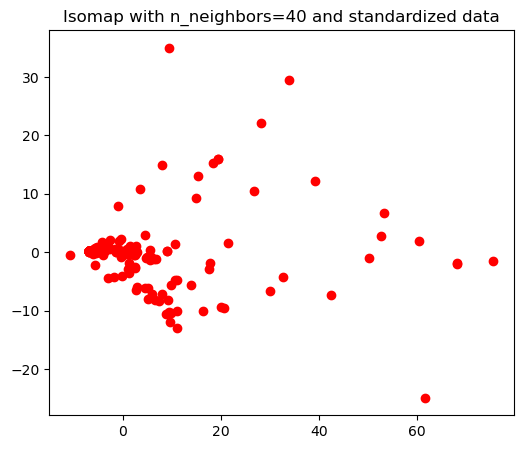

...

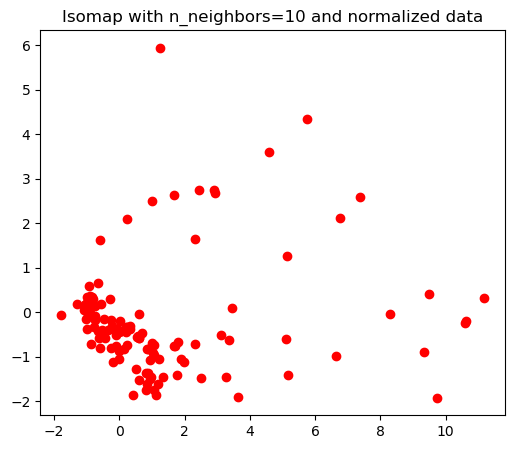

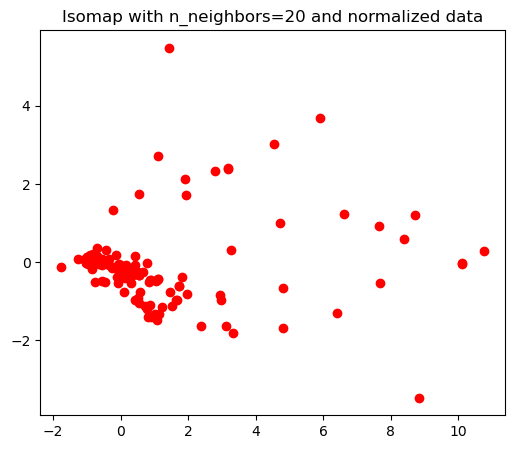

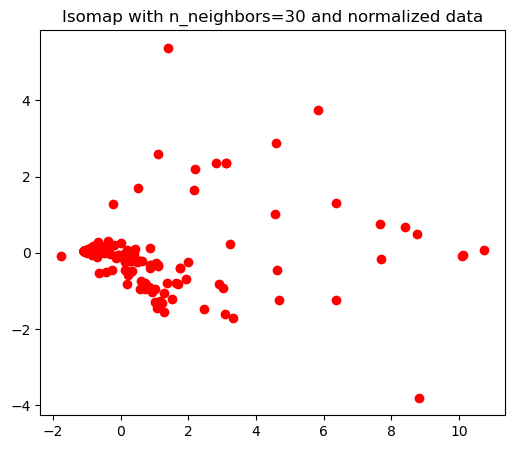

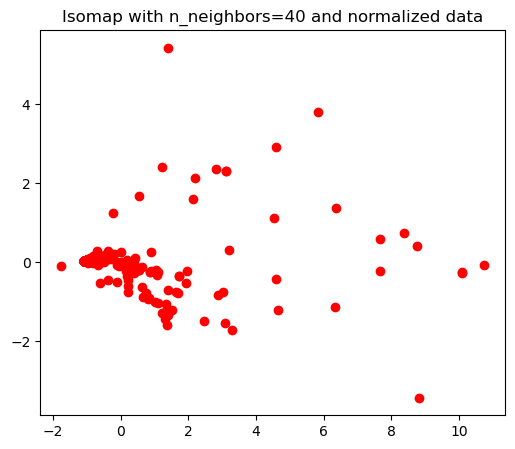

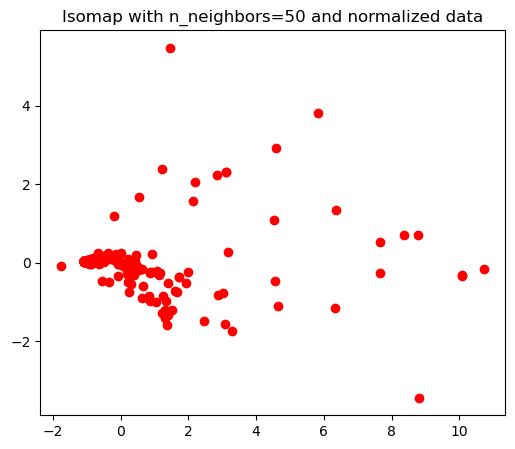

In [88]:

video_names = list(keypoint_counts_dict.keys())
n_neighbors_values_selected = [5,10,20,30,40,50]
n_neighbors_values_full = list(range(5, 51))

for scale_type in ['standardized', 'normalized']:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(n_neighbors_values_full), len(video_names), len(video_names)))

    for i, n_neighbors in enumerate(n_neighbors_values_full):
        embeddings = np.array([keypoint_counts_dict[video_name][scale_type] for video_name in video_names])

        isomap = manifold.Isomap(n_neighbors=n_neighbors, n_components=2, p=1)
        S_isomap = isomap.fit_transform(embeddings)

        # Compute the distance matrix and save it to the 3D array
        distance_matrix = pairwise_distances(S_isomap)
        distance_matrix = distance_matrix/distance_matrix.max()
        distance_matrices[i] = distance_matrix

        # Visualize the 2D embeddings for the selected n_neighbors values
        if n_neighbors in n_neighbors_values_selected:
            plt.figure(figsize=(6, 5))
            plt.scatter(S_isomap[:, 0], S_isomap[:, 1], color='red')
            plt.title(f'Isomap with n_neighbors={n_neighbors} and {scale_type} data')
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'keypoint_average_distance_matrix_isomap_{scale_type}_full.csv')

    # Get the indices of the selected n_neighbors values in the full range
    selected_indices = [n_neighbors_values_full.index(n_neighbors) for n_neighbors in n_neighbors_values_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected n_neighbors values
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'keypoint_average_distance_matrix_isomap_{scale_type}_selected.csv')


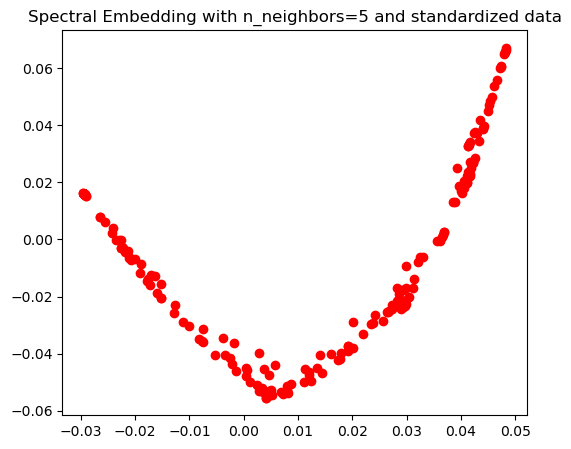

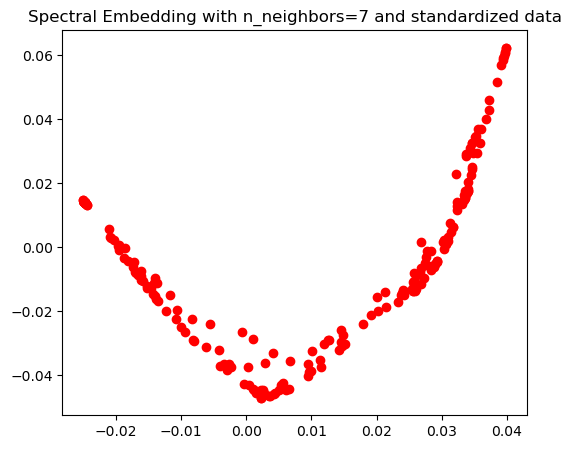

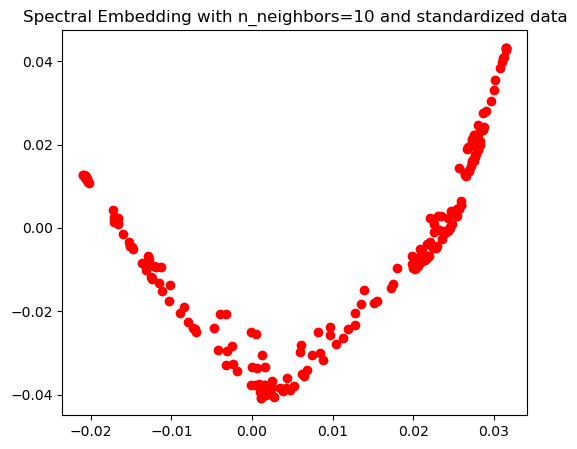

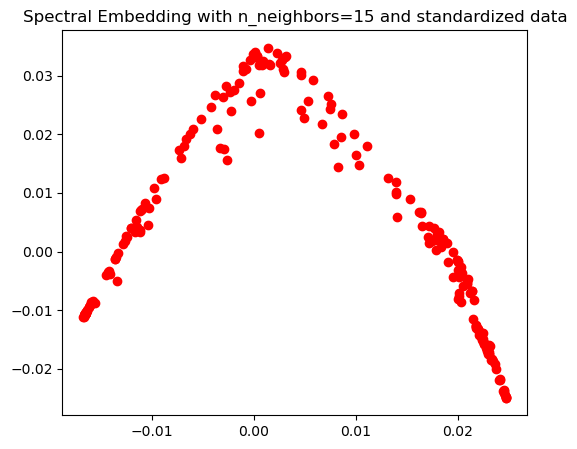

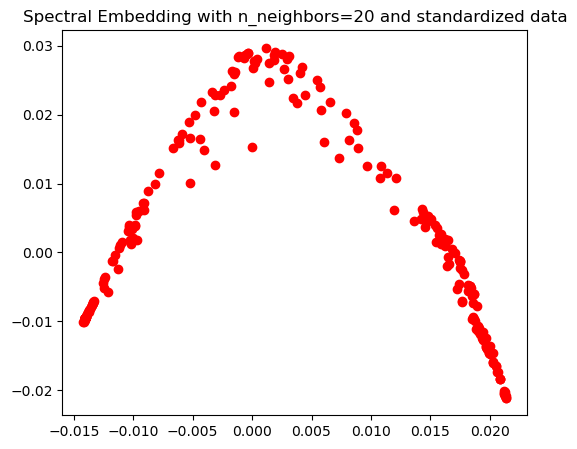

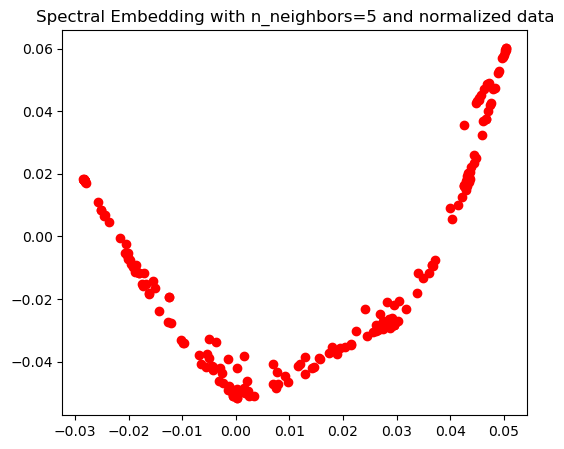

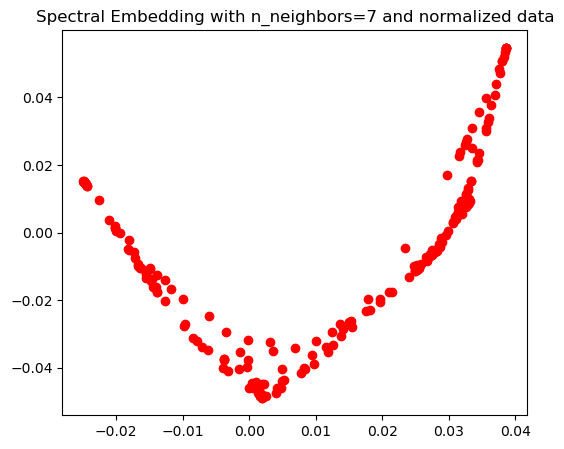

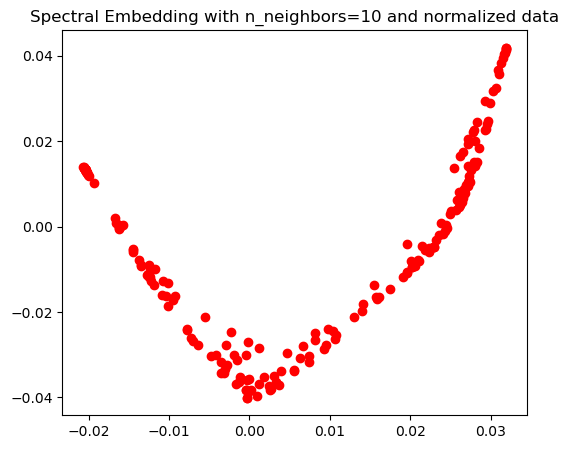

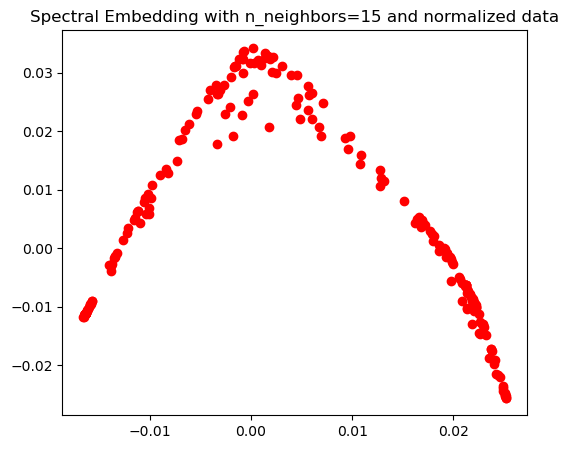

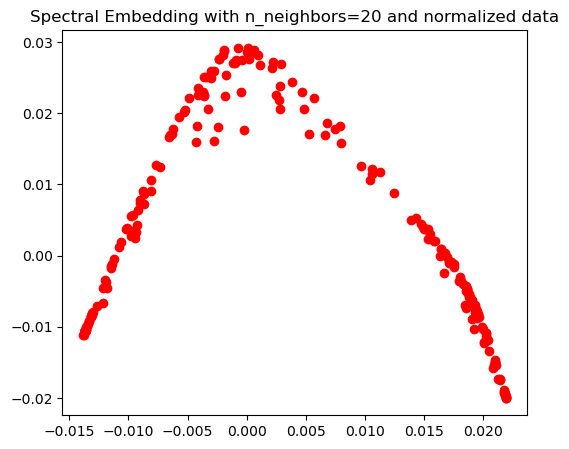

In [89]:

video_names = list(keypoint_counts_dict.keys())
n_neighbors_values_selected = [5,7,10,15,20]
n_neighbors_values_full = list(range(5, 21))

for scale_type in ['standardized', 'normalized']:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(n_neighbors_values_full), len(video_names), len(video_names)))

    for i, n_neighbors in enumerate(n_neighbors_values_full):
        embeddings = np.array([keypoint_counts_dict[video_name][scale_type] for video_name in video_names])

        spectral = manifold.SpectralEmbedding(n_components=2, n_neighbors=n_neighbors, random_state=42)
        S_spectral = spectral.fit_transform(embeddings)

        # Compute the distance matrix and save it to the 3D array
        distance_matrix = pairwise_distances(S_spectral)
        distance_matrix = distance_matrix/distance_matrix.max()
        distance_matrices[i] = distance_matrix

        # Visualize the 2D embeddings for the selected n_neighbors values
        if n_neighbors in n_neighbors_values_selected:
            plt.figure(figsize=(6, 5))
            plt.scatter(S_spectral[:, 0], S_spectral[:, 1], color='red')
            plt.title(f'Spectral Embedding with n_neighbors={n_neighbors} and {scale_type} data')
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'keypoint_average_distance_matrix_spectral_{scale_type}_full.csv')

    # Get the indices of the selected n_neighbors values in the full range
    selected_indices = [n_neighbors_values_full.index(n_neighbors) for n_neighbors in n_neighbors_values_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected n_neighbors values
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'keypoint_average_distance_matrix_spectral_{scale_type}_selected.csv')

In [8]:
# List of CSV files
csv_files = {
    'full': [
        'keypoint_average_distance_matrix_tsne_standardized_full.csv', 
        'keypoint_average_distance_matrix_tsne_normalized_full.csv', 
        'keypoint_average_distance_matrix_isomap_standardized_full.csv', 
        'keypoint_average_distance_matrix_isomap_normalized_full.csv',
        'keypoint_average_distance_matrix_spectral_standardized_full.csv',
        'keypoint_average_distance_matrix_spectral_normalized_full.csv',
        'keypoint_average_distance_matrix_mds_standardized_full.csv',
        'keypoint_average_distance_matrix_mds_normalized_full.csv'
    ],
    'selected': [
        'keypoint_average_distance_matrix_tsne_standardized_selected.csv', 
        'keypoint_average_distance_matrix_tsne_normalized_selected.csv', 
        'keypoint_average_distance_matrix_isomap_standardized_selected.csv', 
        'keypoint_average_distance_matrix_isomap_normalized_selected.csv',
        'keypoint_average_distance_matrix_spectral_standardized_selected.csv',
        'keypoint_average_distance_matrix_spectral_normalized_selected.csv',
        'keypoint_average_distance_matrix_mds_standardized_selected.csv',
        'keypoint_average_distance_matrix_mds_normalized_selected.csv'
    ]
}

# Create empty dictionaries to store the DataFrames and correlation matrices
dataframes = {'full': [], 'selected': []}
flattened_dfs = {'full': {'normalized': pd.DataFrame(), 'standardized': pd.DataFrame()}, 
                 'selected': {'normalized': pd.DataFrame(), 'standardized': pd.DataFrame()}}
correlation_matrices = {'full': {}, 'selected': {}}

# Load the CSV files into DataFrames and perform correlation analysis
for data_type in ['full', 'selected']:
    for file in csv_files[data_type]:
        # Load the CSV file into a DataFrame
        df = pd.read_csv(file, index_col=0)
        dataframes[data_type].append(df)

        # Extract method name and scalar type from file names
        method_name, scalar_type = file.split('_')[4], file.split('_')[5].split('.')[0]

        # Flatten the DataFrame into a 1D array
        array = df.values.flatten()

        # Store the array in the appropriate DataFrame
        flattened_dfs[data_type][scalar_type][method_name] = array

    # Compute the correlation matrices
    for scalar_type in ['normalized', 'standardized']:
        correlation_matrices[data_type][scalar_type] = flattened_dfs[data_type][scalar_type].corr()

        # Print the correlation matrix
        print(f'Correlation matrix for {scalar_type} {data_type} data:')
        print(correlation_matrices[data_type][scalar_type])

# Compute the correlation between 'full' and 'selected' data
for scalar_type in ['normalized', 'standardized']:
    correlation_full_selected = correlation_matrices['full'][scalar_type].corrwith(correlation_matrices['selected'][scalar_type])

    # Print the correlation between 'full' and 'selected' data
    print(f'\nCorrelation between full and selected {scalar_type} data:')
    print(correlation_full_selected)

Correlation matrix for normalized full data:
              tsne    isomap  spectral       mds
tsne      1.000000  0.513778  0.783466  0.543330
isomap    0.513778  1.000000  0.468446  0.988913
spectral  0.783466  0.468446  1.000000  0.486458
mds       0.543330  0.988913  0.486458  1.000000
Correlation matrix for standardized full data:
              tsne    isomap  spectral       mds
tsne      1.000000  0.499689  0.796424  0.523470
isomap    0.499689  1.000000  0.472656  0.988739
spectral  0.796424  0.472656  1.000000  0.481548
mds       0.523470  0.988739  0.481548  1.000000
Correlation matrix for normalized selected data:
              tsne    isomap  spectral       mds
tsne      1.000000  0.475743  0.817684  0.505700
isomap    0.475743  1.000000  0.494813  0.988644
spectral  0.817684  0.494813  1.000000  0.513098
mds       0.505700  0.988644  0.513098  1.000000
Correlation matrix for standardized selected data:
              tsne    isomap  spectral       mds
tsne      1.000000  0.47

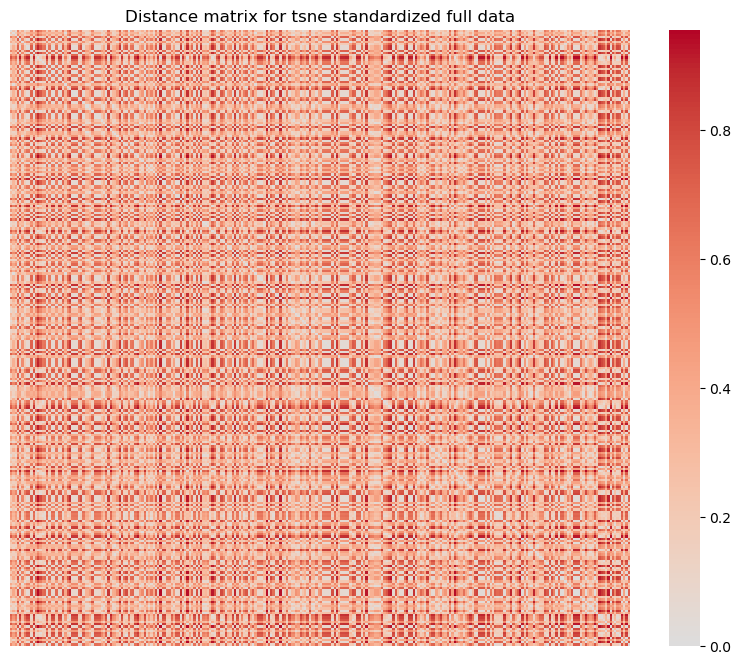

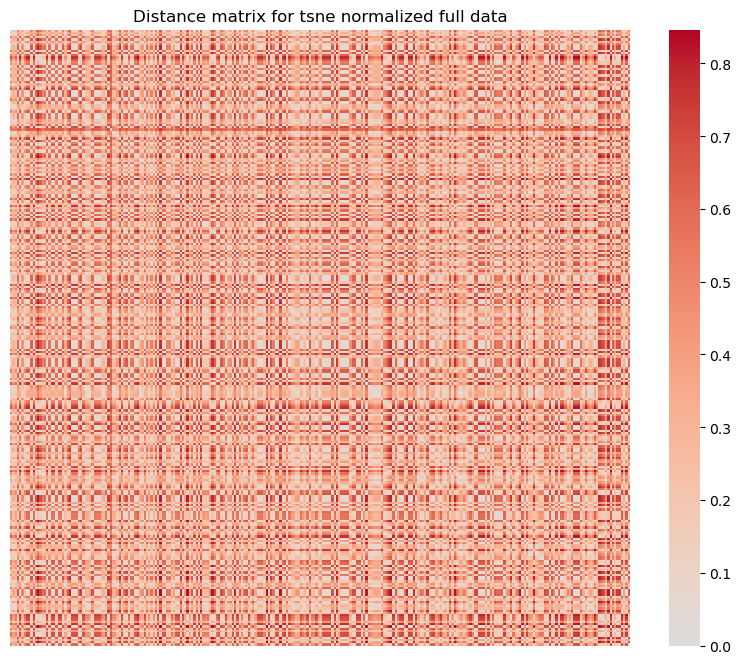

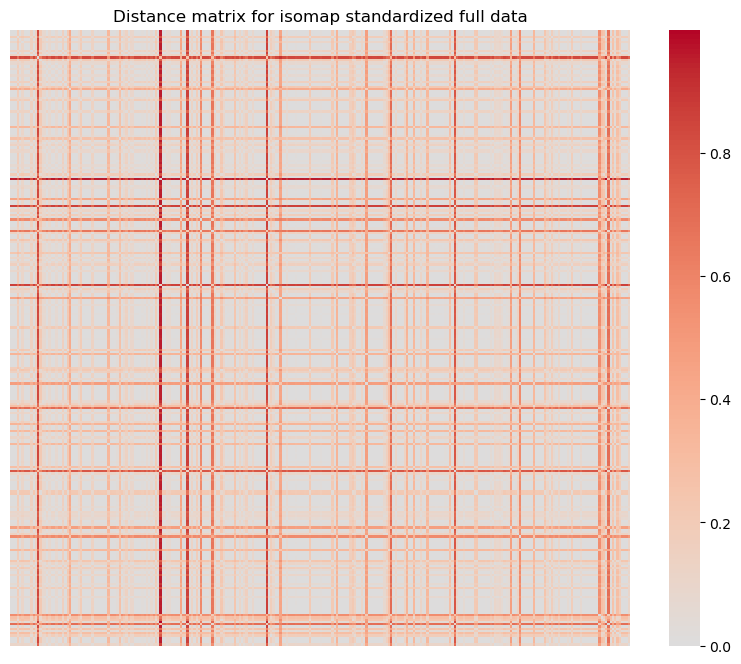

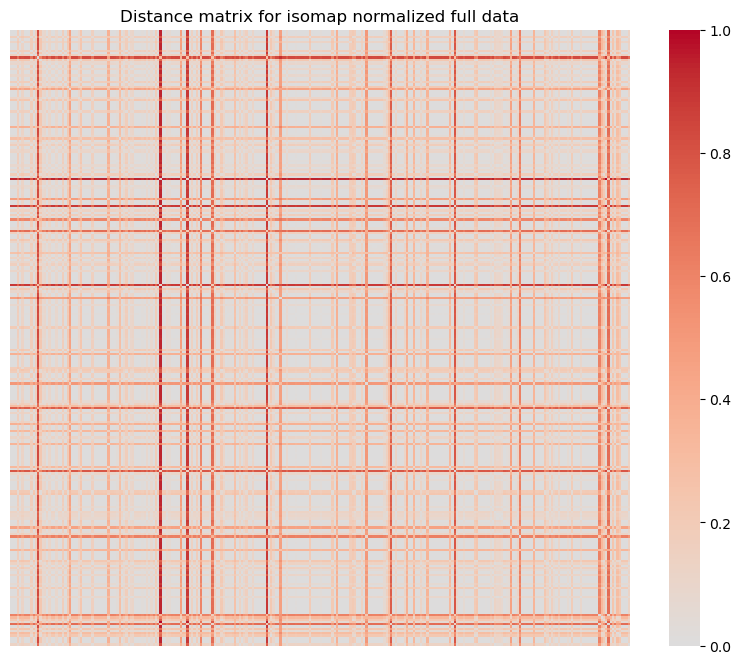

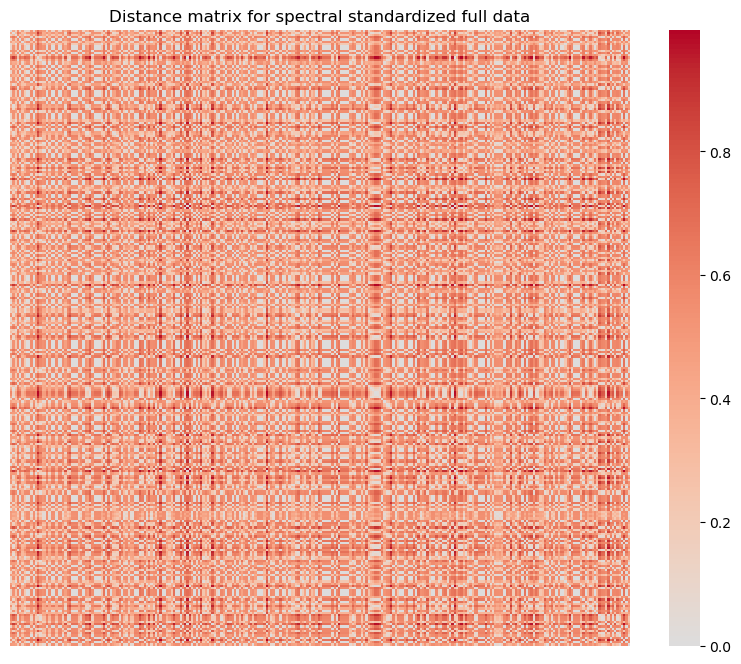

...

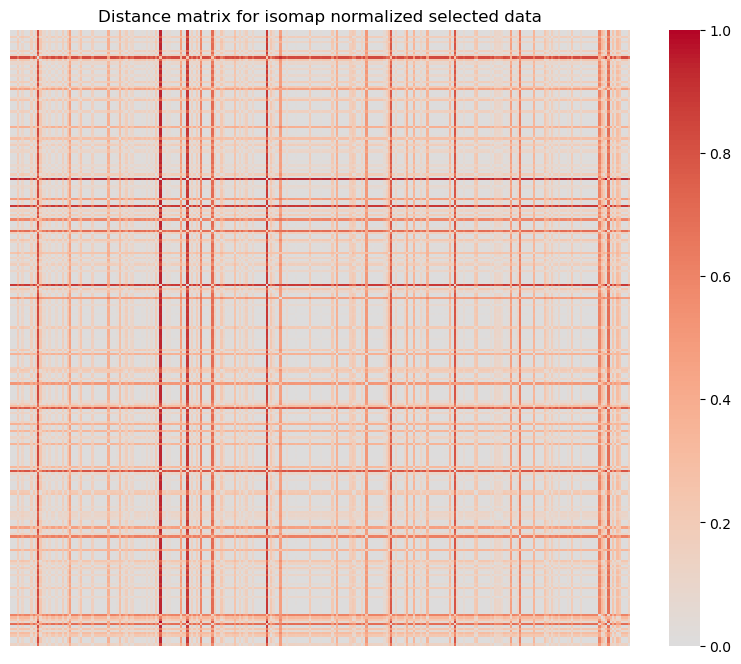

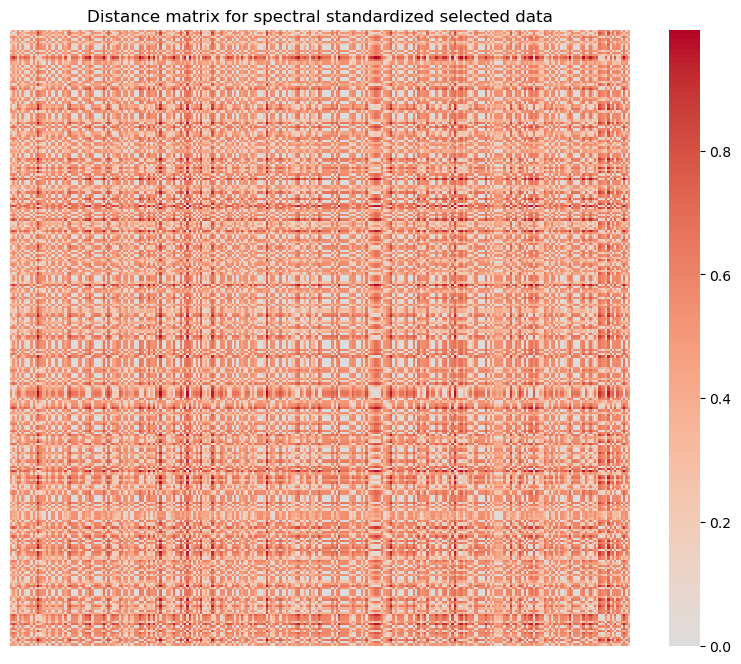

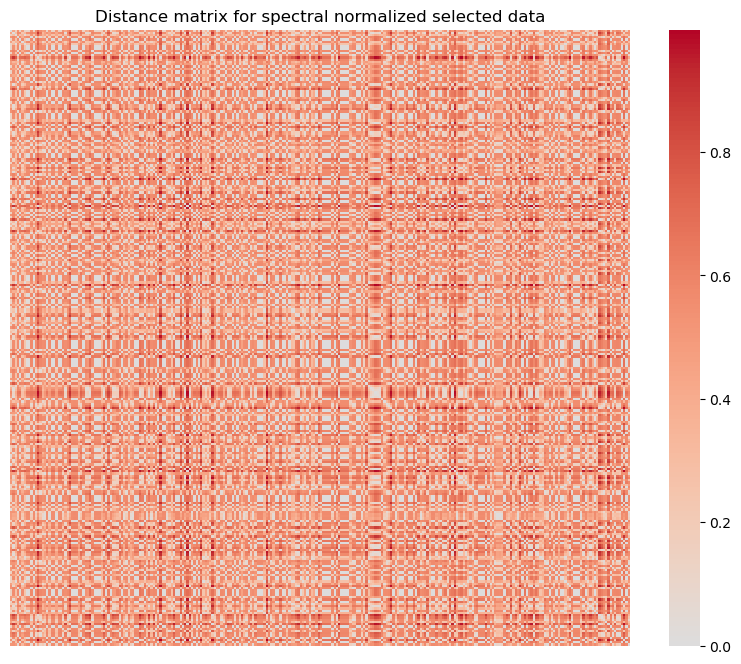

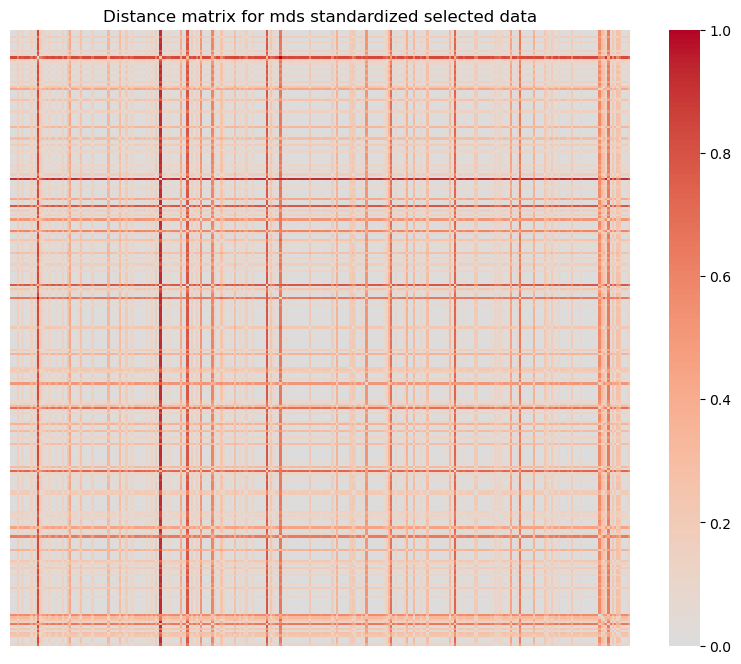

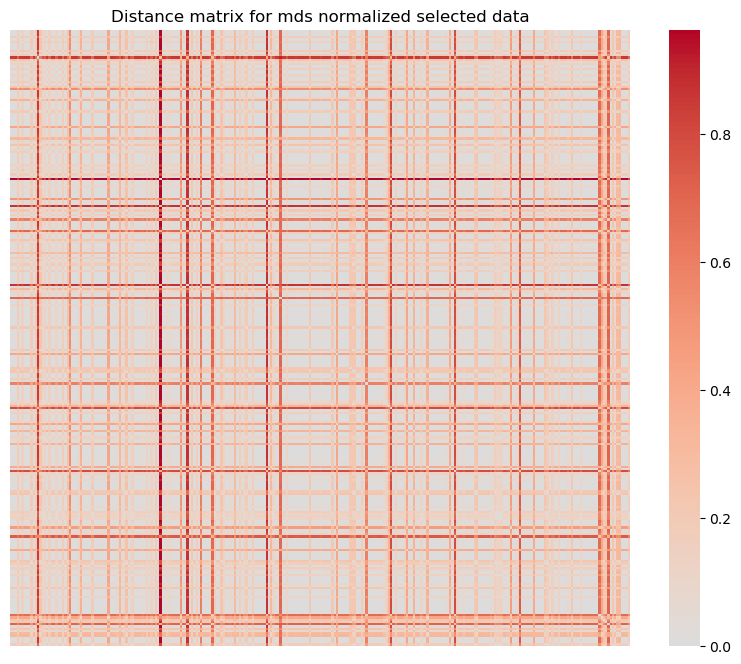

In [10]:
# Create heatmaps for the original distance matrices
for data_type in ['full', 'selected']:
    for i, df in enumerate(dataframes[data_type]):
        # Extract method name and scalar type from file names
        method_name, scalar_type = csv_files[data_type][i].split('_')[4], csv_files[data_type][i].split('_')[5].split('.')[0]

        # Create a heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(df, annot=False, cmap='coolwarm', center=0, yticklabels=False, xticklabels=False)
        plt.title(f'Distance matrix for {method_name} {scalar_type} {data_type} data')
        plt.show()

# OBJECT DETECTION

In [13]:
full_paths = [os.path.join(input_map, video_name) for video_name in video_names]
maps = get_dirs_with_subdir(full_paths, 'instance_segmentation')

print(f'n of maps with searched subdirectories : {len(maps)}' )

n of maps with searched subdirectories : 275


In [15]:

object_maps = get_dirs_with_subdir(full_paths, 'object_detection')

print(f'n of maps with searched subdirectories : {len(object_maps)}' )

n of maps with searched subdirectories : 275


In [17]:

def load_objects_from_hdf5(filename):
    """
    Load the object detection output from an HDF5 file.

    Args:
        filename (str): The name of the HDF5 file to load.

    Returns:
        data (list): A list of dictionaries representing the detection maps for each frame.
    """

    data = []

    with h5py.File(filename, 'r') as f:
        for i in range(len(f.keys())):
            grp = f[str(i)]
            frame_data = {}
            for key in grp.keys():
                if key == "empty":
                    frame_data = None
                else:
                    frame_data[key] = np.array(grp[key])
            data.append(frame_data)

    return data

In [18]:
data_object = {}

for video_name in tqdm(object_maps):
    # Load depth map from HDF5 file
    hdf5_files = find_files(video_name, 'object_detection', 'hdf5')
    if hdf5_files:
        object_df = load_objects_from_hdf5(hdf5_files[0])
        data_object[video_name] = object_df
    else:
        print(f'No object hdf5 {video_name} ')

print(len(data_object.keys()))

100%|██████████| 275/275 [01:00<00:00,  4.51it/s]

275


In [19]:
classes_objects = ['__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parkingmeter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sportsball', 'kite', 'baseballbat', 'baseballglove', 'skateboard', 'surfboard', 'tennisracket', 'bottle', 'N/A', 'wineglass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hotdog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'pottedplant', 'bed', 'N/A', 'diningtable', 'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cellphone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book', 'clock', 'vase', 'scissors', 'teddybear', 'hairdrier', 'toothbrush']

In [27]:
len(classes_objects)

91

In [ ]:
# Step 1: Replace numeric labels with string labels
for video, frames in data_object.items():
    for frame in frames:
        if frame is not None and 'labels' in frame:
            frame['labels'] = [classes_objects[label] for label in frame['labels']]


In [31]:

# Step 2: Create a list of valid classes
valid_classes = [cls for cls in classes_objects if cls not in ['__background__', 'N/A']]

# Step 3: Count the occurrences of each class in each video
video_counts = {}
for video, frames in data_object.items():
    counts = {cls: 0 for cls in valid_classes}
    for frame in frames:
        if frame is not None and 'labels' in frame:
            for label in frame['labels']:
                if label in counts:
                    counts[label] += 1
    video_counts[video] = counts

# Step 4: Create a DataFrame from the counts
object_df = pd.DataFrame.from_dict(video_counts, orient='index')

In [32]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Initialize scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()

# Standardize and normalize all counts
standardized_counts = standard_scaler.fit_transform(object_df.values)
normalized_counts = minmax_scaler.fit_transform(object_df.values)

# Create new DataFrames for the standardized and normalized counts
standardized_df_object = pd.DataFrame(standardized_counts, index=object_df.index, columns=object_df.columns)
normalized_df_object = pd.DataFrame(normalized_counts, index=object_df.index, columns=object_df.columns)

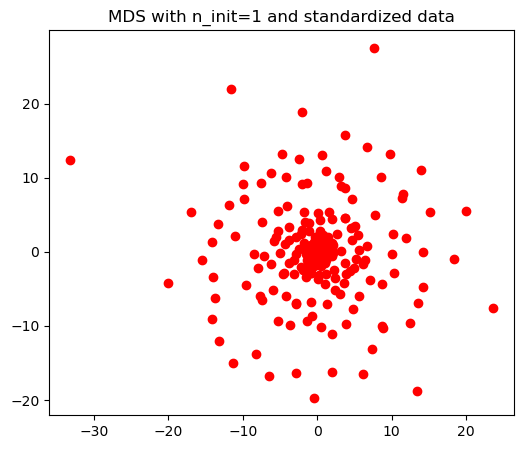

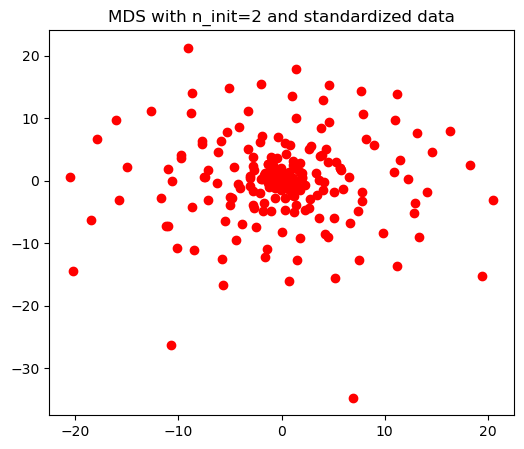

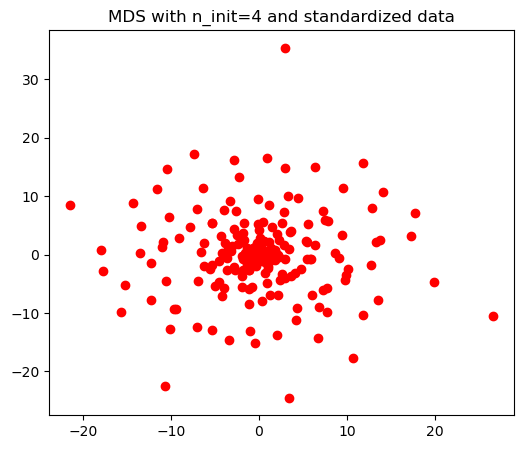

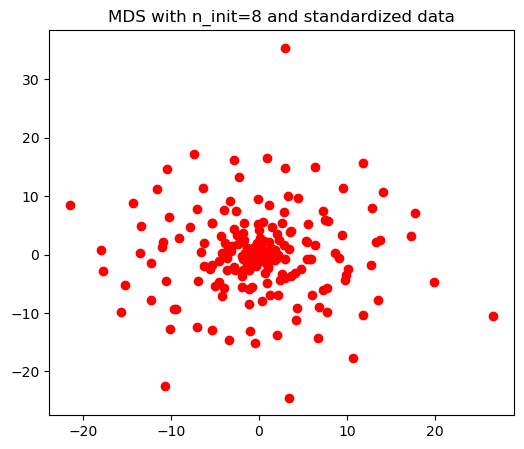

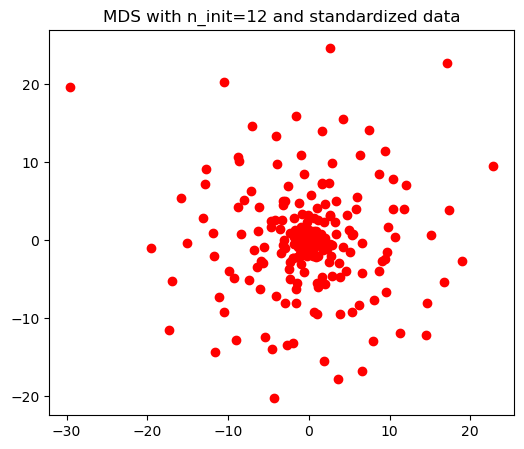

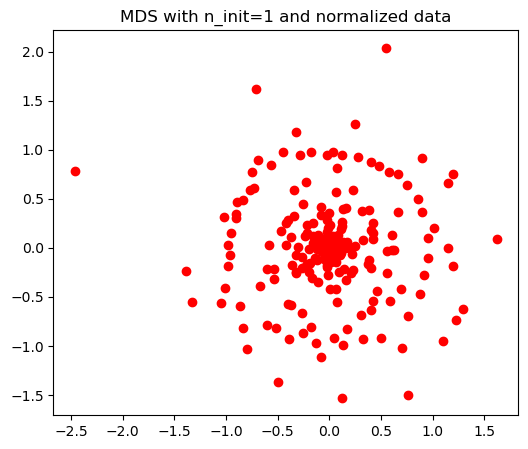

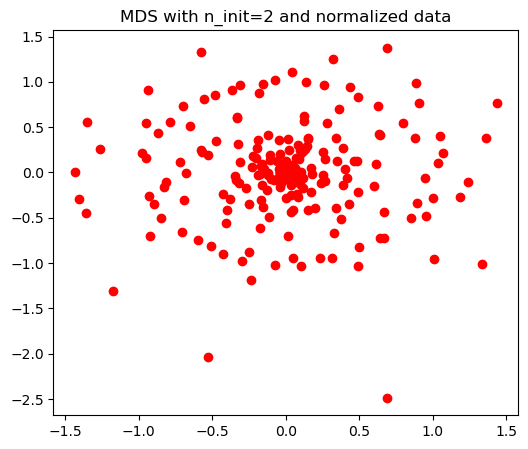

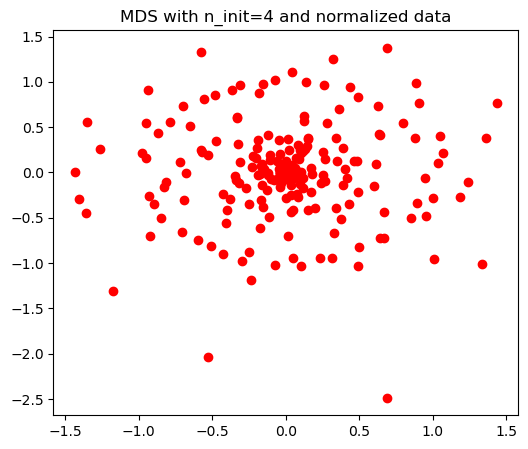

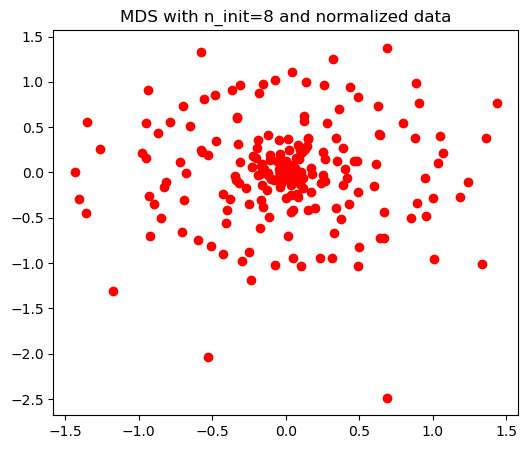

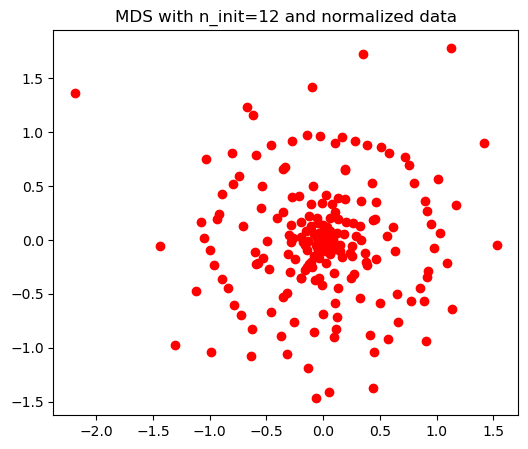

In [33]:
video_names = list(standardized_df_object.index)
n_init_values_selected = [1, 2, 4, 8, 12]
n_init_values_full = list(range(1, 13))

for scale_type, df in [('standardized', standardized_df_object), ('normalized', normalized_df_object)]:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(n_init_values_full), len(video_names), len(video_names)))

    for i, n_init in enumerate(n_init_values_full):

        embeddings = df.values

        md_scaling = manifold.MDS(
            n_components=2,
            max_iter=2000,
            n_init=n_init,
            random_state=0,
            normalized_stress=False,
        )
        S_scaling = md_scaling.fit_transform(embeddings)

        # Compute the distance matrix and save it to the 3D array
        distance_matrix = pairwise_distances(S_scaling)
        # Normalize the distance matrix
        distance_matrix = distance_matrix / distance_matrix.max()
        distance_matrices[i] = distance_matrix

        # Visualize the 2D embeddings for the selected n_init values
        if n_init in n_init_values_selected:
            plt.figure(figsize=(6, 5))
            plt.scatter(S_scaling[:, 0], S_scaling[:, 1], color='red')
            plt.title(f'MDS with n_init={n_init} and {scale_type} data')
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'object_average_distance_matrix_mds_{scale_type}_full.csv')

    # Get the indices of the selected n_init values in the full range
    selected_indices = [n_init_values_full.index(n_init) for n_init in n_init_values_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected n_init values
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'object_average_distance_matrix_mds_{scale_type}_selected.csv')

[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.001s...
[t-SNE] Computed neighbors for 275 samples in 0.206s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.503456
[t-SNE] KL divergence after 5000 iterations: 0.442905


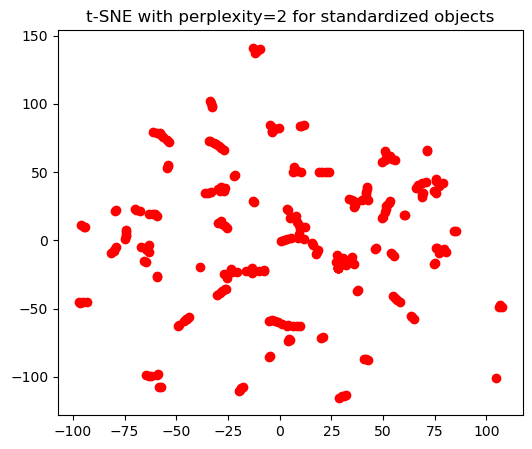

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.001s...
[t-SNE] Computed neighbors for 275 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.085335
[t-SNE] KL divergence after 5000 iterations: 0.558649
[t-SNE] Computing 13 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.648041
[t-SNE] KL divergence after 5000 iterations: 0.628730
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

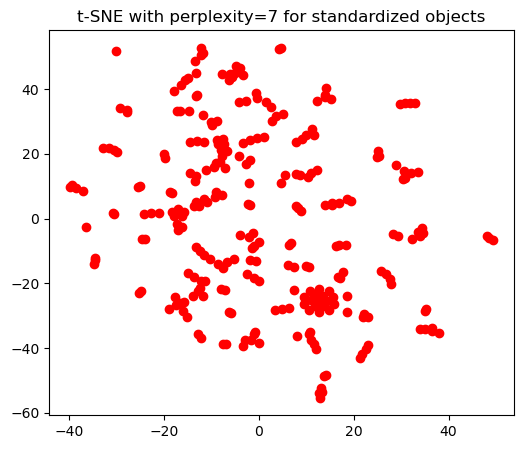

[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.017944
[t-SNE] KL divergence after 2600 iterations: 0.708945
[t-SNE] Computing 28 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.657387
[t-SNE] KL divergence after 2800 iterations: 0.713403
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

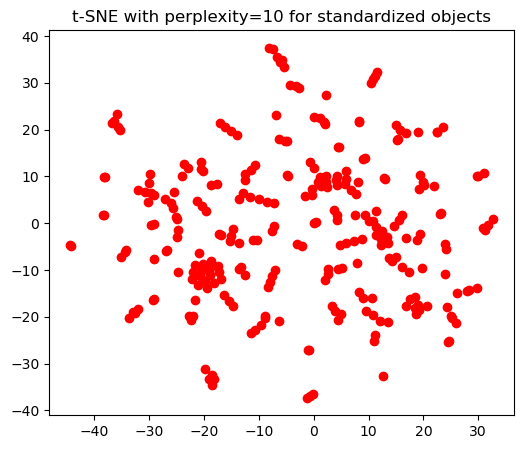

[t-SNE] Computing 34 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.274590
[t-SNE] KL divergence after 5000 iterations: 0.738382
[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.201164
[t-SNE] KL divergence after 2400 iterations: 0.721931
[t-SNE] Computing 40 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.006s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

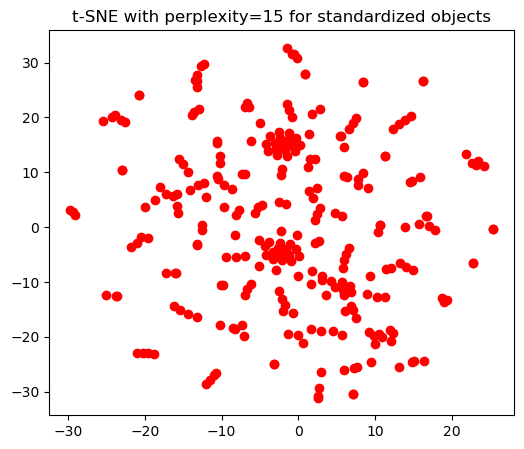

[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.036463
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.792240
[t-SNE] KL divergence after 1700 iterations: 0.699135
[t-SNE] Computing 52 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.001s...
[t-SNE] Computed neighbors for 275 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.115146
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.105644
[t-SNE] KL divergence after 3900 iterations: 0.675914
[t-SNE] Computing 55 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.165584
[t-SNE] KL divergence after 250 iteratio

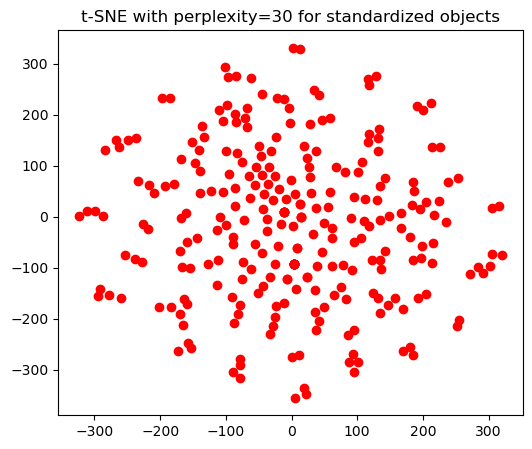

[t-SNE] Computing 94 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.001s...
[t-SNE] Computed neighbors for 275 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.320480
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.588619
[t-SNE] KL divergence after 5000 iterations: 0.402247
[t-SNE] Computing 97 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.329320
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.164959
[t-SNE] KL divergence after 5000 iterations: 0.324797
[t-SNE] Computing 100 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.338322
[t-SNE] KL divergence after 250 iterati

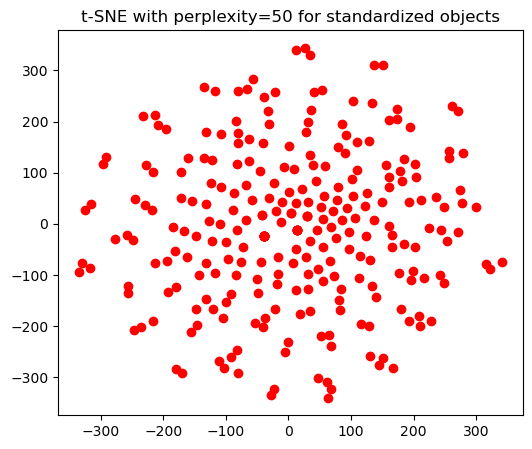

[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.001s...
[t-SNE] Computed neighbors for 275 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.774208
[t-SNE] KL divergence after 5000 iterations: 0.410582


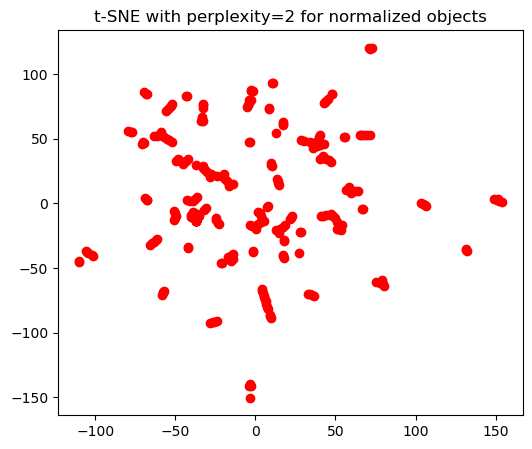

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.118187
[t-SNE] KL divergence after 5000 iterations: 0.511488
[t-SNE] Computing 13 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.477448
[t-SNE] KL divergence after 5000 iterations: 0.587148
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

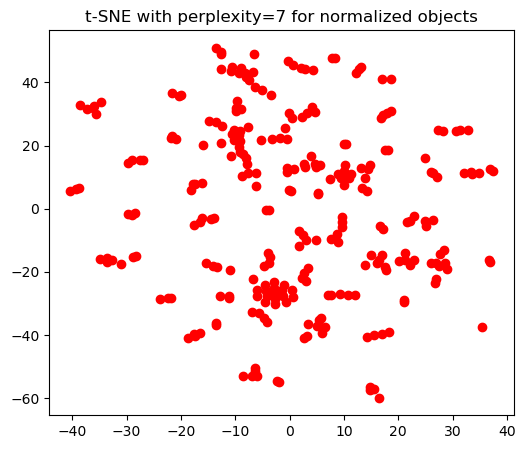

[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.666901
[t-SNE] KL divergence after 3000 iterations: 0.683691
[t-SNE] Computing 28 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.610359
[t-SNE] KL divergence after 3000 iterations: 0.672192
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

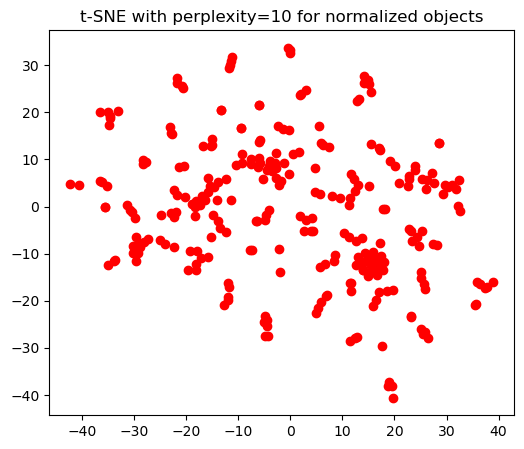

[t-SNE] Computing 34 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.430367
[t-SNE] KL divergence after 2550 iterations: 0.693890
[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.338848
[t-SNE] KL divergence after 4500 iterations: 0.695774
[t-SNE] Computing 40 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iteratio

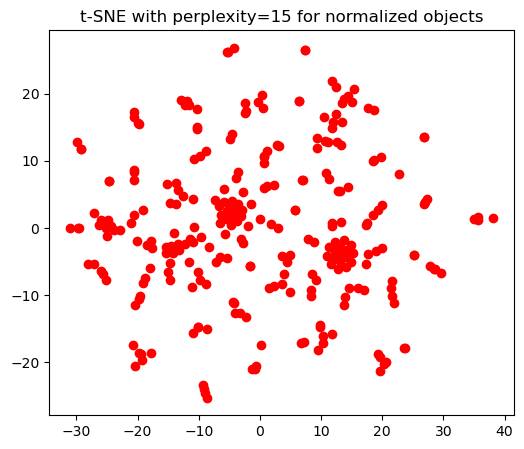

[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.002830
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.909122
[t-SNE] KL divergence after 3350 iterations: 0.664867
[t-SNE] Computing 52 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.010553
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.150185
[t-SNE] KL divergence after 3350 iterations: 0.647642
[t-SNE] Computing 55 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.016555
[t-SNE] KL divergence after 250 iteratio

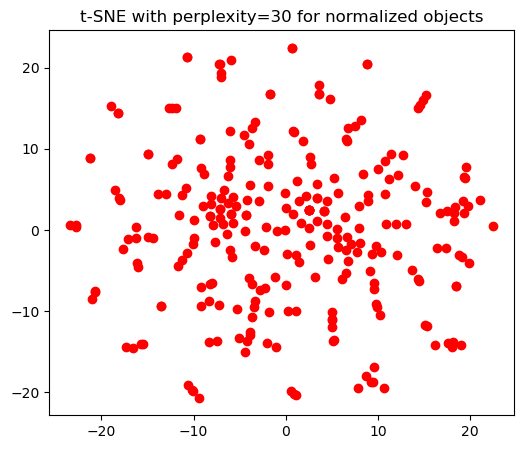

[t-SNE] Computing 94 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.035605
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.757202
[t-SNE] KL divergence after 2850 iterations: 0.522164
[t-SNE] Computing 97 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.036491
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.364845
[t-SNE] KL divergence after 2700 iterations: 0.491642
[t-SNE] Computing 100 nearest neighbors...
[t-SNE] Indexed 275 samples in 0.000s...
[t-SNE] Computed neighbors for 275 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 275 / 275
[t-SNE] Mean sigma: 0.037372
[t-SNE] KL divergence after 250 iterati

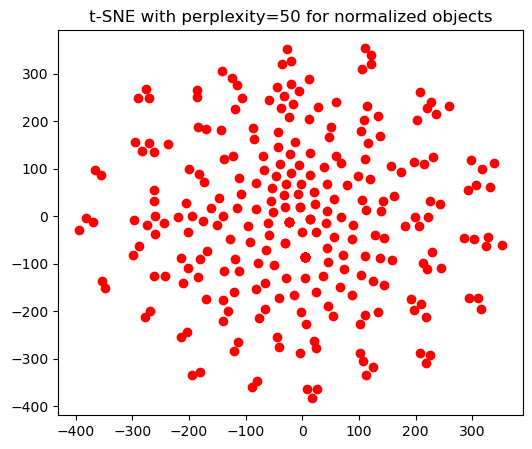

In [34]:
video_names = list(standardized_df_object.index)
perplexities_selected = [2,7,10,15,30,50]
perplexities_full = list(range(2, 51))

for scale_type, df in [('standardized', standardized_df_object), ('normalized', normalized_df_object)]:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(perplexities_full), len(video_names), len(video_names)))

    for i, perplex in enumerate(perplexities_full):
        embeddings = df.values

        tsne = TSNE(n_components=2, random_state=0, learning_rate=30, perplexity=perplex, n_iter=5000, n_iter_without_progress=300, verbose=1)
        embedding_2D = tsne.fit_transform(embeddings)

        # Compute the distance matrix
        distance_matrix = pairwise_distances(embedding_2D)

        # Normalize the distance matrix
        distance_matrix = distance_matrix / distance_matrix.max()

        # Save the normalized distance matrix to the 3D array
        distance_matrices[i] = distance_matrix

        # Visualize the result for the selected perplexities
        if perplex in perplexities_selected:
            plt.figure(figsize=(6, 5))
            for point, counter in zip(embedding_2D, embeddings):
                plt.scatter(point[0], point[1], color='red')
            plt.title(f"t-SNE with perplexity={perplex} for {scale_type} objects")
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'object_average_distance_matrix_tsne_{scale_type}_full.csv')

    # Get the indices of the selected perplexities in the full range
    selected_indices = [perplexities_full.index(perplex) for perplex in perplexities_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected perplexities
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'object_average_distance_matrix_tsne_{scale_type}_selected.csv')

/tank/tgn252/anaconda3/envs/metadata_stats/lib/python3.9/site-packages/sklearn/manifold/_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 3 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/tank/tgn252/anaconda3/envs/metadata_stats/lib/python3.9/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/tank/tgn252/anaconda3/envs/metadata_stats/lib/python3.9/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/tank/tgn252/anaconda3/envs/metadata_stats/lib/python3.9/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix 

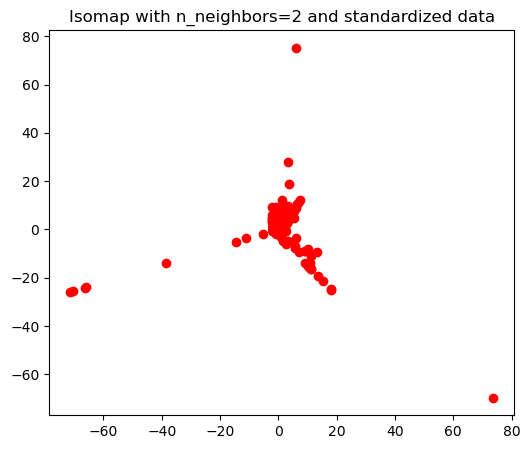

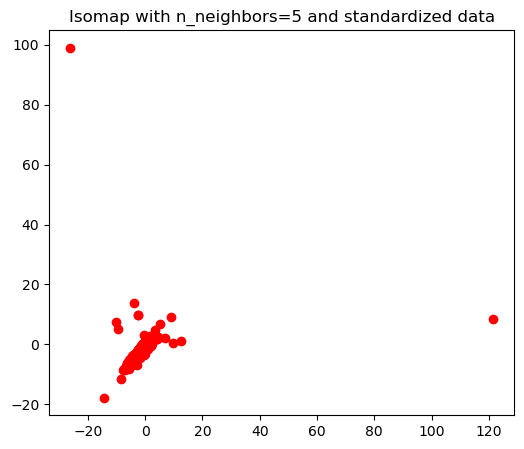

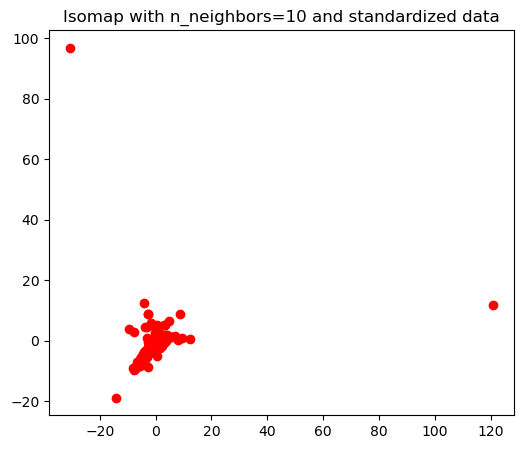

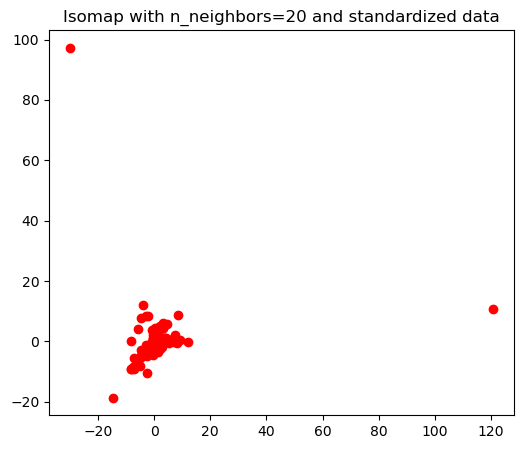

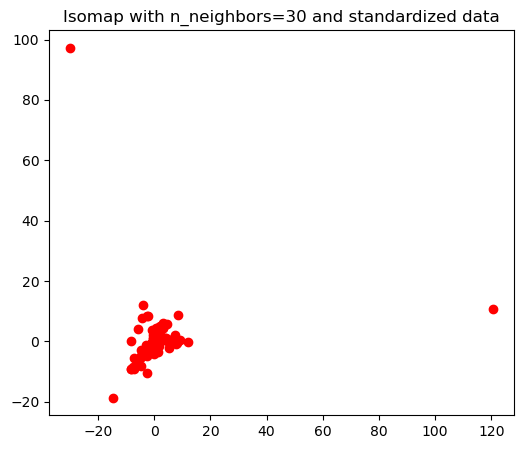

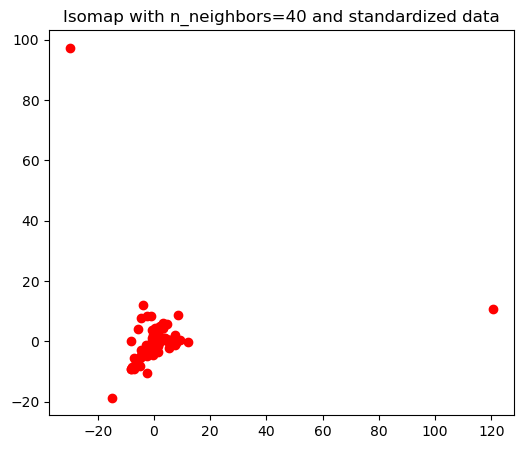

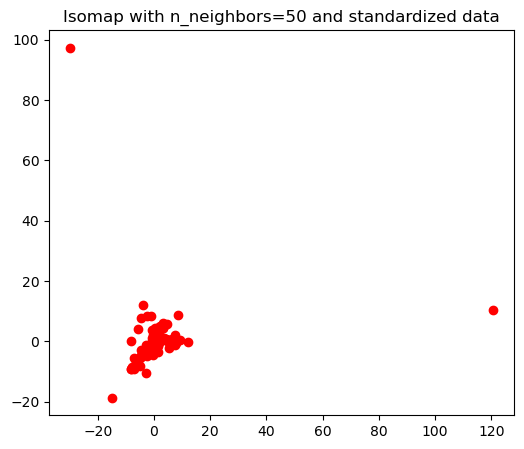

/tank/tgn252/anaconda3/envs/metadata_stats/lib/python3.9/site-packages/sklearn/manifold/_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 3 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/tank/tgn252/anaconda3/envs/metadata_stats/lib/python3.9/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/tank/tgn252/anaconda3/envs/metadata_stats/lib/python3.9/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/tank/tgn252/anaconda3/envs/metadata_stats/lib/python3.9/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix 

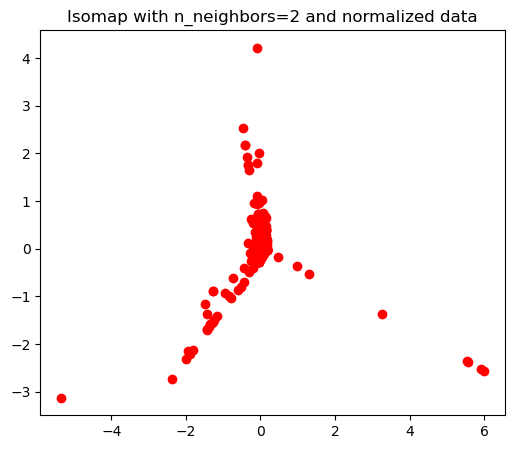

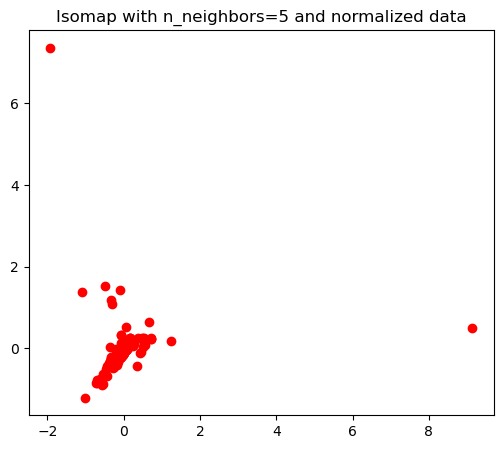

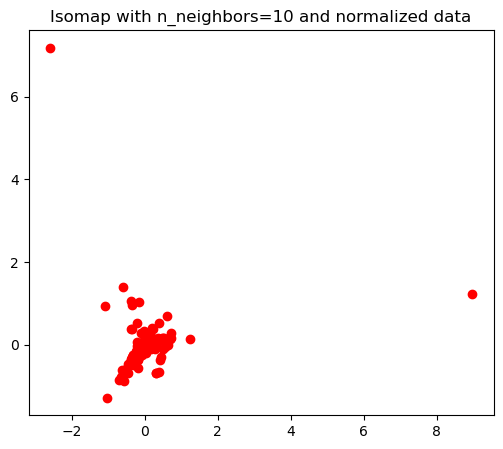

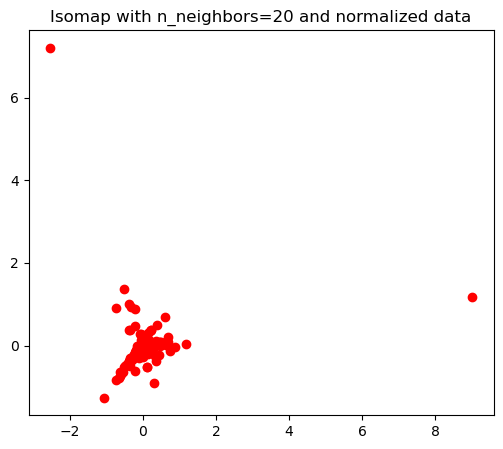

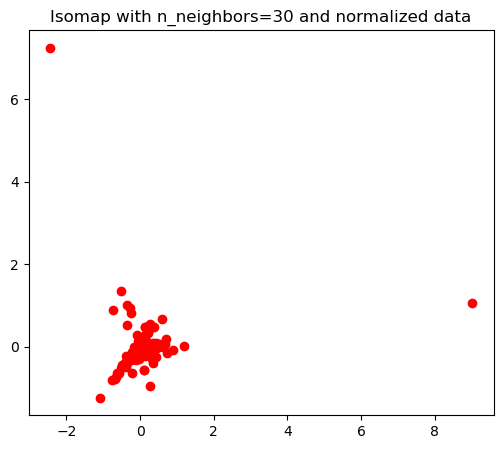

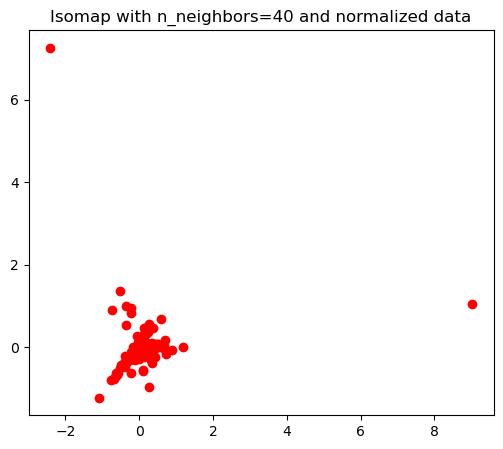

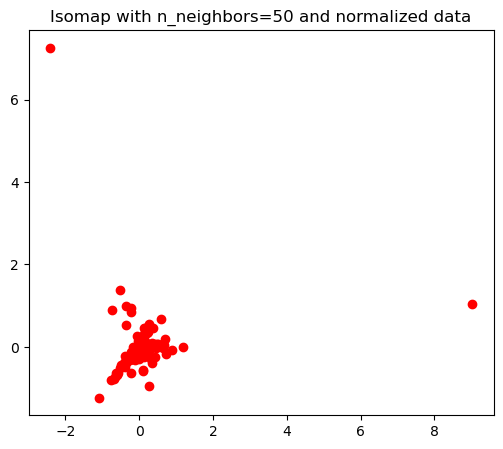

In [38]:
video_names = list(standardized_df_object.index)
n_neighbors_values_selected = [2,5,10,20,30,40,50]
n_neighbors_values_full = list(range(2, 51))

for scale_type, df in [('standardized', standardized_df_object), ('normalized', normalized_df_object)]:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(n_neighbors_values_full), len(video_names), len(video_names)))

    for i, n_neighbors in enumerate(n_neighbors_values_full):
        embeddings = df.values

        isomap = manifold.Isomap(n_neighbors=n_neighbors, n_components=2, p=1)
        S_isomap = isomap.fit_transform(embeddings)

        # Compute the distance matrix and save it to the 3D array
        distance_matrix = pairwise_distances(S_isomap)
        distance_matrix = distance_matrix/distance_matrix.max()
        distance_matrices[i] = distance_matrix

        # Visualize the 2D embeddings for the selected n_neighbors values
        if n_neighbors in n_neighbors_values_selected:
            plt.figure(figsize=(6, 5))
            plt.scatter(S_isomap[:, 0], S_isomap[:, 1], color='red')
            plt.title(f'Isomap with n_neighbors={n_neighbors} and {scale_type} data')
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'object_average_distance_matrix_isomap_{scale_type}_full.csv')

    # Get the indices of the selected n_neighbors values in the full range
    selected_indices = [n_neighbors_values_full.index(n_neighbors) for n_neighbors in n_neighbors_values_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected n_neighbors values
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'object_average_distance_matrix_isomap_{scale_type}_selected.csv')

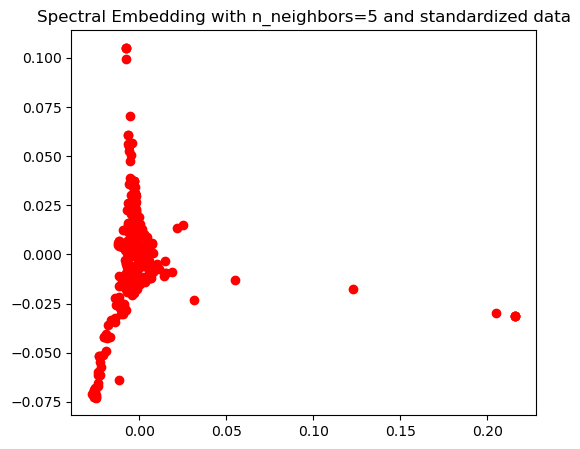

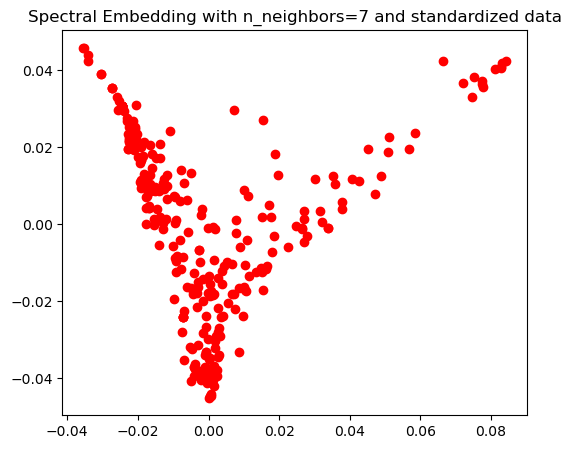

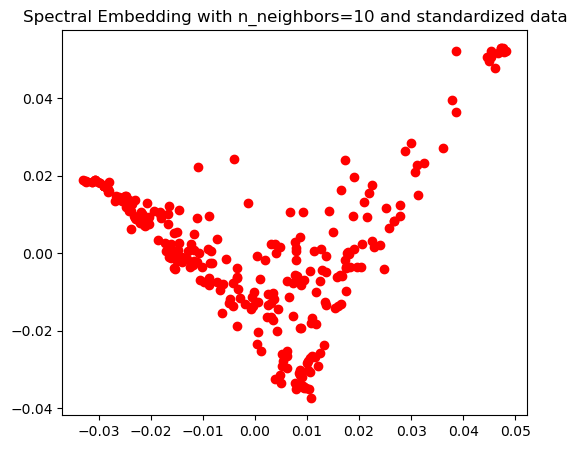

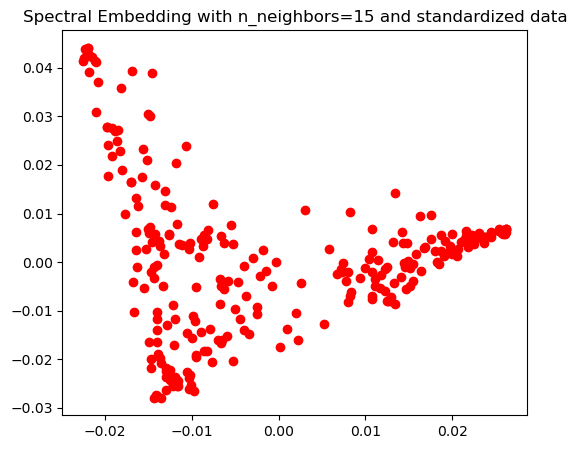

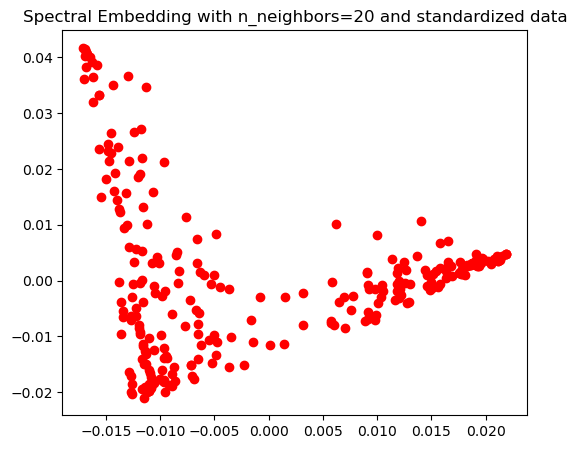

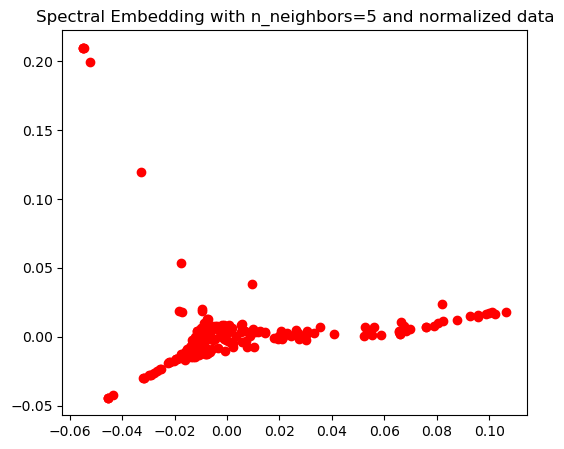

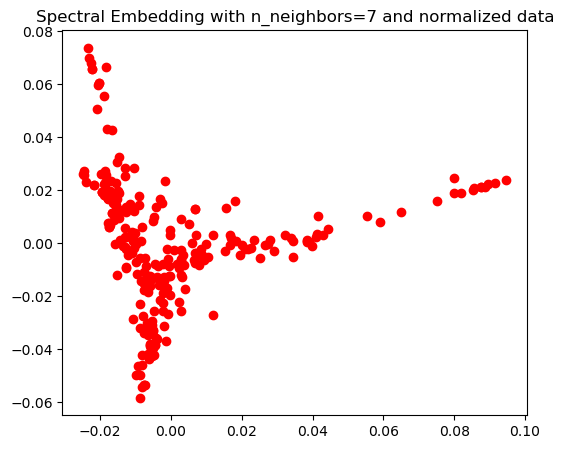

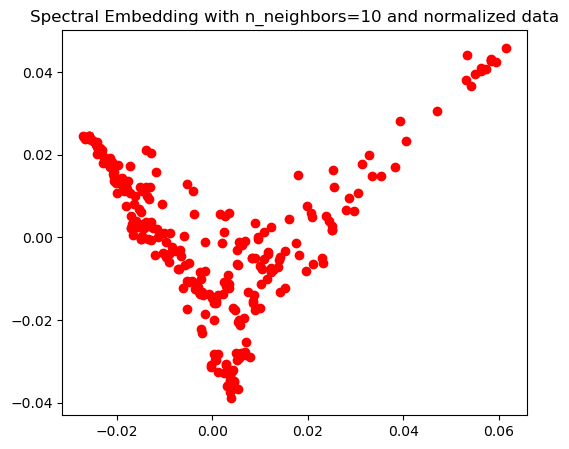

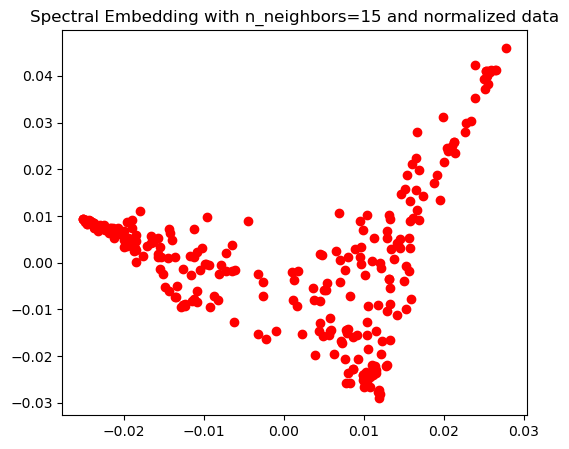

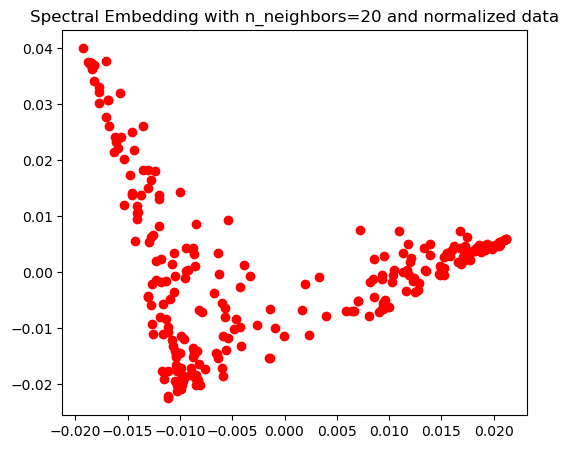

In [36]:
video_names = list(standardized_df_object.index)
n_neighbors_values_selected = [5,7,10,15,20]
n_neighbors_values_full = list(range(5, 21))

for scale_type, df in [('standardized', standardized_df_object), ('normalized', normalized_df_object)]:
    # Create a 3D array to store all the distance matrices
    distance_matrices = np.empty((len(n_neighbors_values_full), len(video_names), len(video_names)))

    for i, n_neighbors in enumerate(n_neighbors_values_full):
        embeddings = df.values

        spectral = manifold.SpectralEmbedding(n_components=2, n_neighbors=n_neighbors, random_state=42)
        S_spectral = spectral.fit_transform(embeddings)

        # Compute the distance matrix and save it to the 3D array
        distance_matrix = pairwise_distances(S_spectral)
        distance_matrix = distance_matrix/distance_matrix.max()
        distance_matrices[i] = distance_matrix

        # Visualize the 2D embeddings for the selected n_neighbors values
        if n_neighbors in n_neighbors_values_selected:
            plt.figure(figsize=(6, 5))
            plt.scatter(S_spectral[:, 0], S_spectral[:, 1], color='red')
            plt.title(f'Spectral Embedding with n_neighbors={n_neighbors} and {scale_type} data')
            plt.show()

    # Compute the average distance matrix for the full range
    average_distance_matrix_full = distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_full = pd.DataFrame(average_distance_matrix_full, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_full.to_csv(f'object_average_distance_matrix_spectral_{scale_type}_full.csv')

    # Get the indices of the selected n_neighbors values in the full range
    selected_indices = [n_neighbors_values_full.index(n_neighbors) for n_neighbors in n_neighbors_values_selected]

    # Select the corresponding distance matrices
    selected_distance_matrices = distance_matrices[selected_indices]

    # Compute the average distance matrix for the selected n_neighbors values
    average_distance_matrix_selected = selected_distance_matrices.mean(axis=0)

    # Save the average distance matrix to a DataFrame
    average_distance_df_selected = pd.DataFrame(average_distance_matrix_selected, index=video_names, columns=video_names)
    # Save the DataFrame to a CSV file
    average_distance_df_selected.to_csv(f'object_average_distance_matrix_spectral_{scale_type}_selected.csv')